# Projet 3 - OpenFoodFacts
 Concevez une application au service de la service de la santé publique - Partie 2

## Sommaire

* Traitement et import des données
* Chargement du dataset

* Création des tables de travail
    * Création des tables de travail avec les variables numériques seules
    * Création de la table de travail avec les variables numériques et les variables qualitatives
    * Création de la table de travail avec les variables retenues pour l'application
    * Création de la table de travail Kmean

* Analyse exploratoire des données
    * Analyses univariées
        * Création des df pour l'analyse univariée
        * Affichage des distributions des indicateurs
        * Affichage du graphique paiplot

    * Analyses Bivariées
        * Table de corrélation
        * Boxplot de corrélation entre le nutrigrade et le nutriscore
        * Boxplot de corrélation entre les nutriments et le nutrigrade
        * ANOVA
            * ANOVA à 2 facteurs
            * Test de Fisher
        * ETA CARRE
            * Affichage de la corrélation entre nutritiongrade et energy
        * CHI 2
            * Table de corrélation CHI2
                * Valeur du PNNS en fonction du nutrigrade
            * Affichage de la table de corrélation

    * Analyse Multivariée
        * KMEAN
           * Préparation du jeu de données
           * Instanciation et fitting
           * Projection par le biais d'une PCA
        * PCA
            * Préparation du jeu de données
            * Scalling
            * Composants
            * Tracé des cercles de corrélation
            * Projections



## Traitement et import des données

In [1]:
# Import des librairies
import sys
import numpy as np
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import sklearn
import matplotlib.pyplot as plt
import plotly.express as px
import statsmodels.formula.api as smf
import statsmodels.api as sm

from scipy.stats import chi2_contingency
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Vérification des libairies installées
print('Verification de la mise à jour des librairies utilisées :')
print('Python: {}'.format(sys.version))
print('NumPy         : ' + np.version.full_version)
print('Pandas        : ' + pd.__version__)
print('Matplotlib    : ' + mpl.__version__)
print('Seaborn       : ' + sns.__version__)
print('sklearn       : ' + sklearn.__version__)
print('statsmodels   : ' + sm.__version__)

Verification de la mise à jour des librairies utilisées :
Python: 3.10.9 (main, Jan 11 2023, 09:18:20) [Clang 14.0.6 ]
NumPy         : 1.24.2
Pandas        : 1.5.3
Matplotlib    : 3.6.3
Seaborn       : 0.12.2
sklearn       : 1.2.1
statsmodels   : 0.13.5


In [2]:
# Réglage de l'affichage de données
pd.set_option('display.max_row',250)
pd.set_option('display.max_column',300)
pd.set_option('display.precision', 5)

### Chargement du dataset et des fonctions

In [3]:
# Importation du jeu de données
data_fr = pd.read_csv('fr_data_clean.csv')

### Création des tables de travail

#### Création des tables de travail avec les variables numériques seules

In [4]:
data_chiffres = data_fr[["energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "sodium_100g", "salt_100g"]]
data_chiffres_cols = data_fr[["energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "sodium_100g"]]

In [5]:
data_fr.columns

Index(['created_t', 'last_modified_t', 'product_name', 'generic_name',
       'quantity', 'packaging', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'traces_fr', 'serving_size',
       'additives_n', 'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition_score_fr_100g'],
      dtype='object')

#### Création de la table de travail avec les variables numériques et les variables qualitatives

In [6]:
data_scores = data_fr[["nutrition_score_fr_100g", "nutrition_grade_fr", "energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "salt_100g", "sodium_100g"]]

#### Création de la table de travail avec les variables retenues pour l'application

In [7]:
data_appli = data_fr[["pnns_groups_2", "nutrition_grade_fr","nutrition_score_fr_100g", "energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "sodium_100g"]]

#### Création de la table de travail Kmean

In [8]:
data_Kmean = data_fr[["energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "sodium_100g"]]

## Analyse exploratoire des données

### Analyses univariées

In [9]:
data_chiffres.describe()

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g,salt_100g
count,60451.00000,60451.00000,60451.00000,60451.00000,60451.00000,60451.00000,60451.00000,60451.00000,60451.00000
mean,268.25336,9.50692,5.42905,19.95244,13.37241,1.86045,7.74763,0.42430,1.07773
std,188.02215,15.17749,8.49903,26.24259,18.96513,4.05251,7.84387,1.45545,3.69680
min,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000
25%,103.96750,0.00000,0.30000,0.00000,1.00000,0.00000,1.90000,0.03150,0.08000
50%,248.56597,2.00000,2.00000,5.80000,4.00000,0.10000,6.00000,0.21654,0.55000
75%,396.03250,14.00000,7.40000,37.18500,17.90000,2.40000,10.80000,0.48031,1.22000
max,3700.04780,100.00000,100.00000,100.00000,100.00000,100.00000,100.00000,39.37008,100.00000


#### Création des df pour l'analyse univariée

In [10]:
# Melt afin de passer les colonnes en lignes
melt_chiffres = pd.melt(data_chiffres)

In [11]:
#Création des df d'affichage des graphique d'analyse univariés
df_energy=melt_chiffres[melt_chiffres['variable'] == 'energy_100g']
df_fat=melt_chiffres[melt_chiffres['variable'] == 'fat_100g']
df_sat_fat=melt_chiffres[melt_chiffres['variable'] == 'saturated_fat_100g']
df_carbhyd=melt_chiffres[melt_chiffres['variable'] == 'carbohydrates_100g']
df_sugars=melt_chiffres[melt_chiffres['variable'] == 'sugars_100g']
df_fiber=melt_chiffres[melt_chiffres['variable'] == 'fiber_100g']
df_proteins=melt_chiffres[melt_chiffres['variable'] == 'proteins_100g']
df_salt=melt_chiffres[melt_chiffres['variable'] == 'salt_100g']
df_sodium = melt_chiffres[melt_chiffres['variable'] == 'sodium_100g']

#### Affichage des distributions des indicateurs

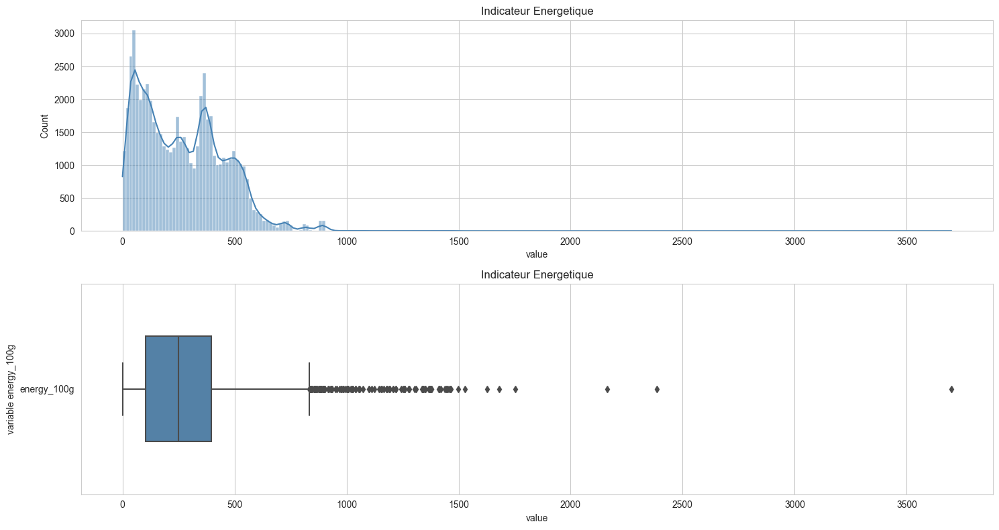

In [12]:
# Indicateur Kcal energy_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot( df_energy['value'], kde = True, color='SteelBlue')
plt.title("Indicateur Energetique")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_energy['value'], y=df_energy['variable'], orient ="h" , width=0.5, color='SteelBlue')
plt.title('Indicateur Energetique')
plt.ylabel("variable energy_100g")

plt.tight_layout()

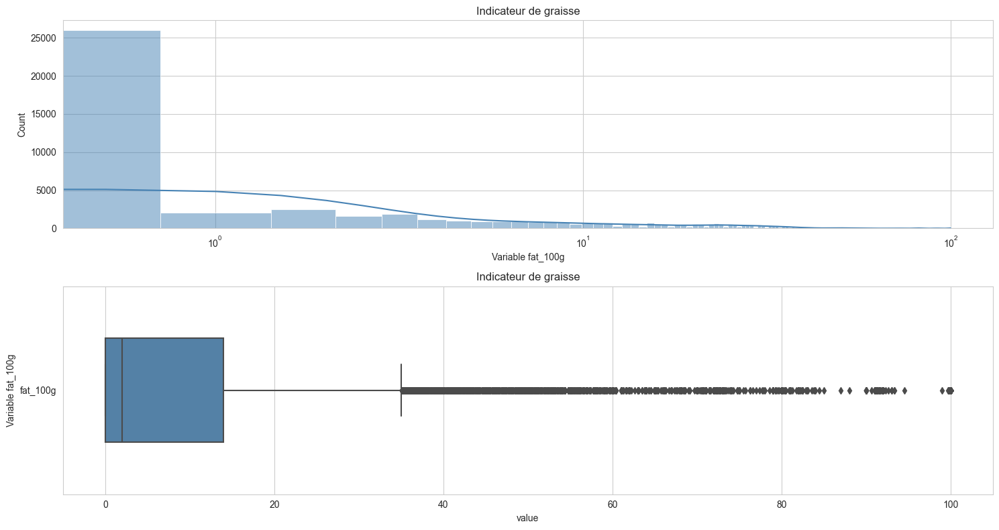

In [13]:
# Indicateur de gras fat_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_fat['value'], kde = True, color='SteelBlue')
plt.title("Indicateur de graisse")
plt.xscale('log')
plt.xlabel("Variable fat_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_fat['value'], y=df_fat['variable'], orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur de graisse")
plt.ylabel("Variable fat_100g")

plt.tight_layout()

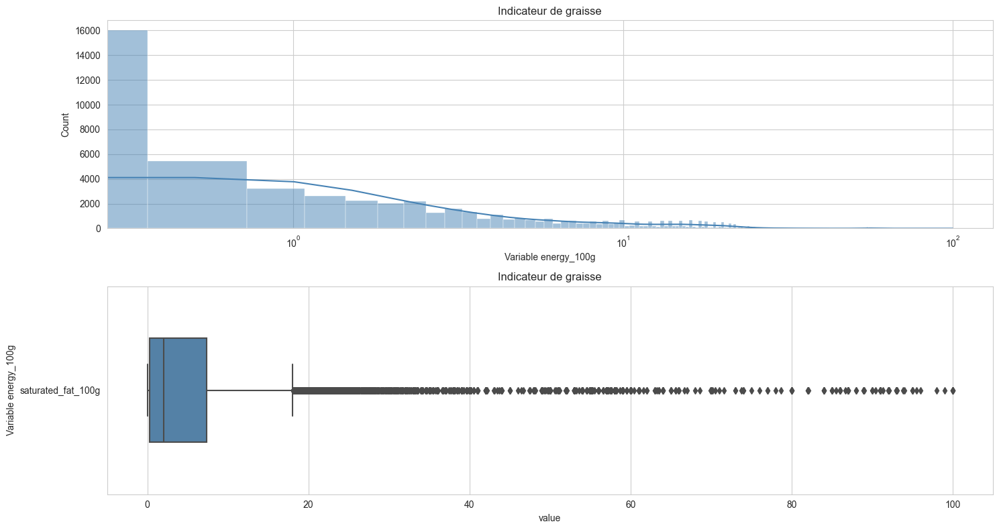

In [14]:
# Indicateur de graisse saturée saturated_fat_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_sat_fat['value'], kde = True, color='SteelBlue')
plt.title("Indicateur de graisse")
plt.xscale('log')
plt.xlabel("Variable energy_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_sat_fat['value'], y=df_sat_fat['variable'], orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur de graisse")
plt.ylabel("Variable energy_100g")

plt.tight_layout()

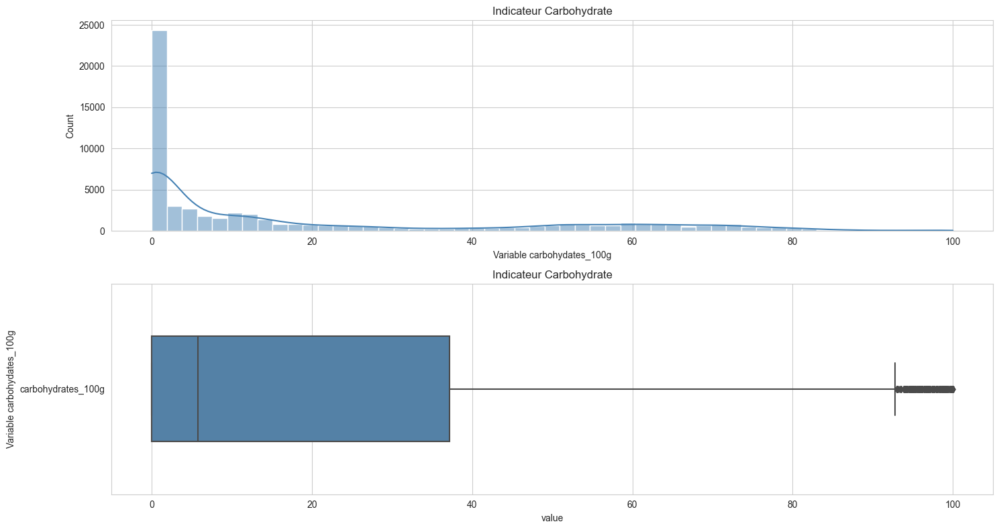

In [15]:
# Indicateur carbohydates_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_carbhyd['value'], kde = True, color='SteelBlue')
plt.title('Indicateur Carbohydrate')
plt.xlabel("Variable carbohydates_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_carbhyd['value'], y=df_carbhyd['variable'],orient ="h", width=0.5, color='SteelBlue')
plt.title("Indicateur Carbohydrate")
plt.ylabel('Variable carbohydates_100g')

plt.tight_layout()

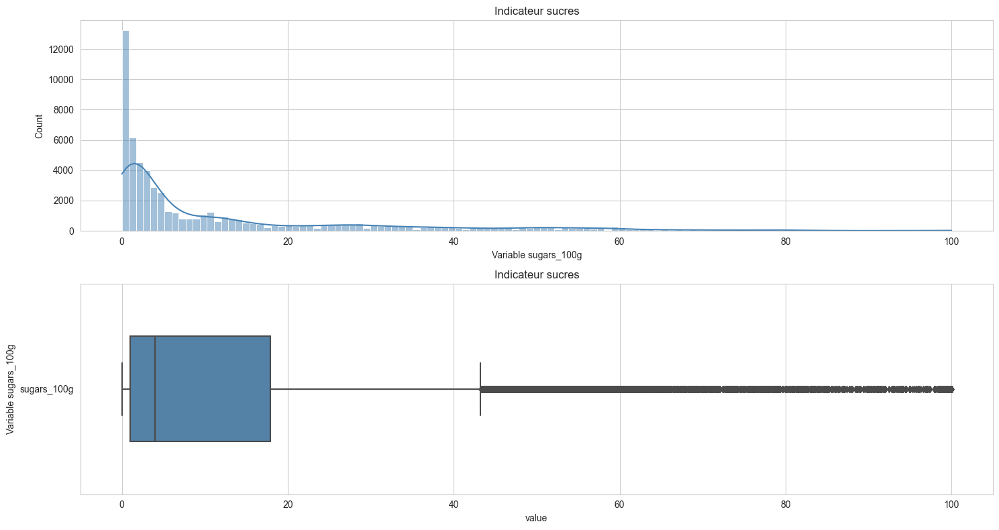

In [16]:
# Indicateur Sucre sugar_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_sugars['value'], kde = True, color='SteelBlue')
plt.title('Indicateur sucres')
plt.xlabel("Variable sugars_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_sugars['value'], y=df_sugars['variable'],orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur sucres")
plt.ylabel("Variable sugars_100g")


plt.tight_layout()

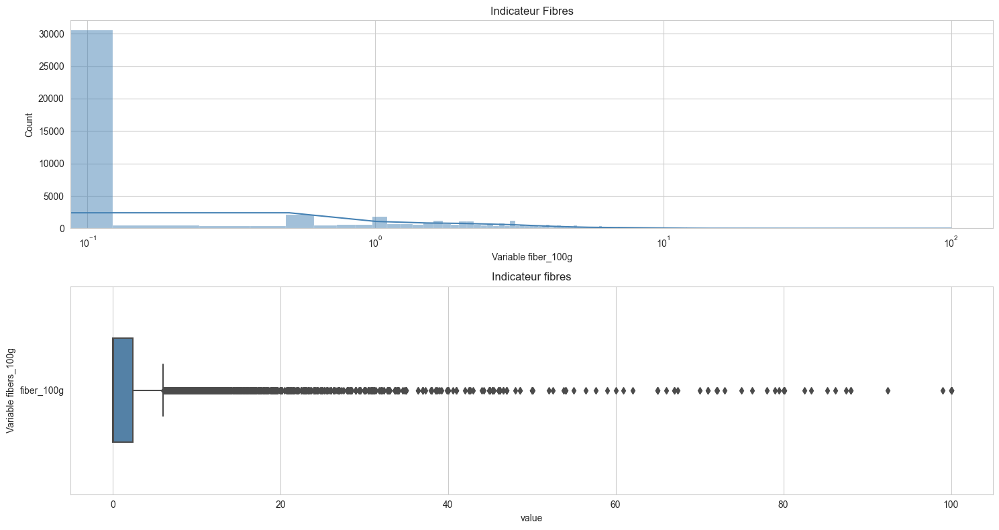

In [17]:
# Indicateur fibres fiber_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_fiber['value'], kde = True, color='SteelBlue')
plt.title("Indicateur Fibres")
plt.xscale('log')
plt.xlabel("Variable fiber_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_fiber['value'], y=df_fiber['variable'],orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur fibres")
plt.ylabel("Variable fibers_100g")

plt.tight_layout()

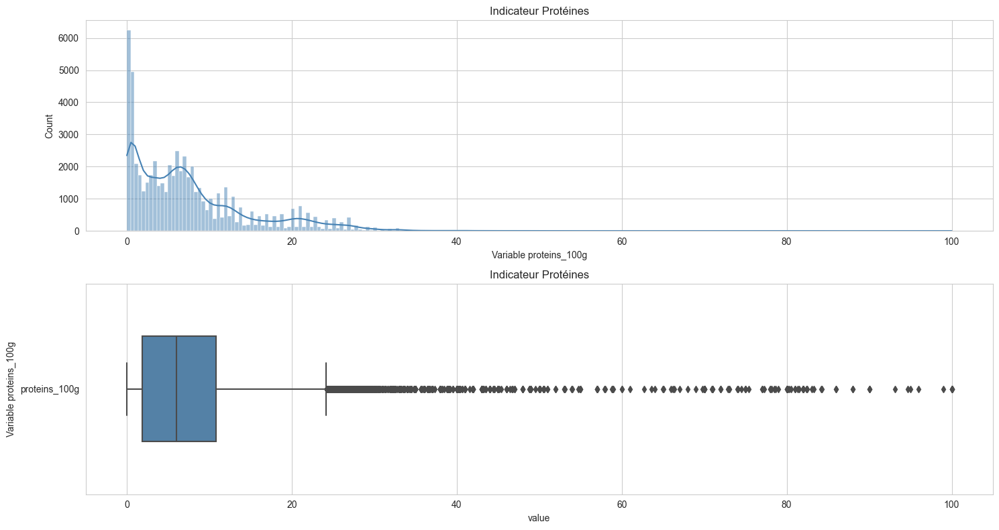

In [18]:
# Indicateur proteines proteins_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_proteins['value'], kde = True, color='SteelBlue')
plt.title("Indicateur Protéines")
plt.xlabel("Variable proteins_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_proteins['value'], y=df_proteins['variable'],orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur Protéines")
plt.ylabel("Variable proteins_100g")

plt.tight_layout()

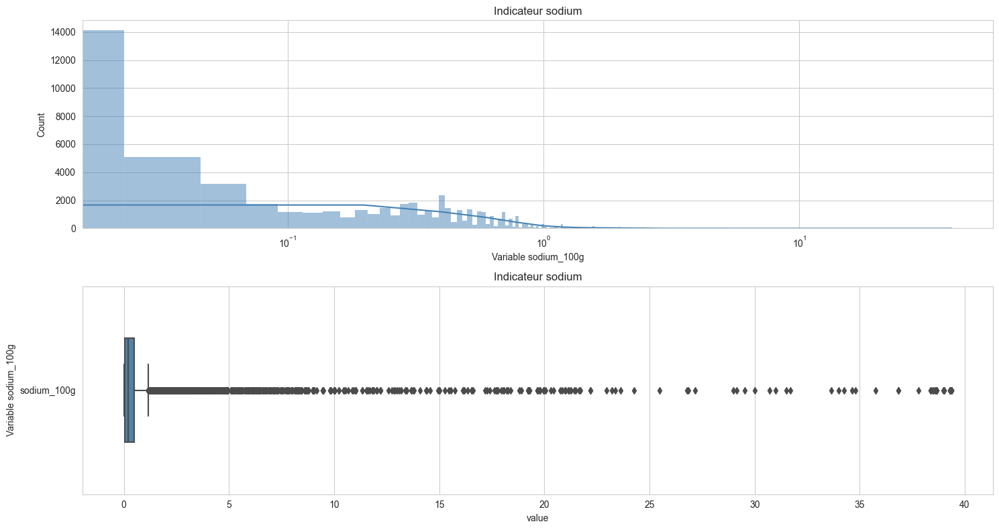

In [19]:
# Indicateur sodium sodium_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_sodium['value'], kde = True, color='SteelBlue')
plt.title('Indicateur sodium')
plt.xscale('log')
plt.xlabel("Variable sodium_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_sodium['value'], y=df_sodium['variable'],orient="h", width=0.5, color='SteelBlue')
plt.title("Indicateur sodium")
plt.ylabel("Variable sodium_100g")

plt.tight_layout()

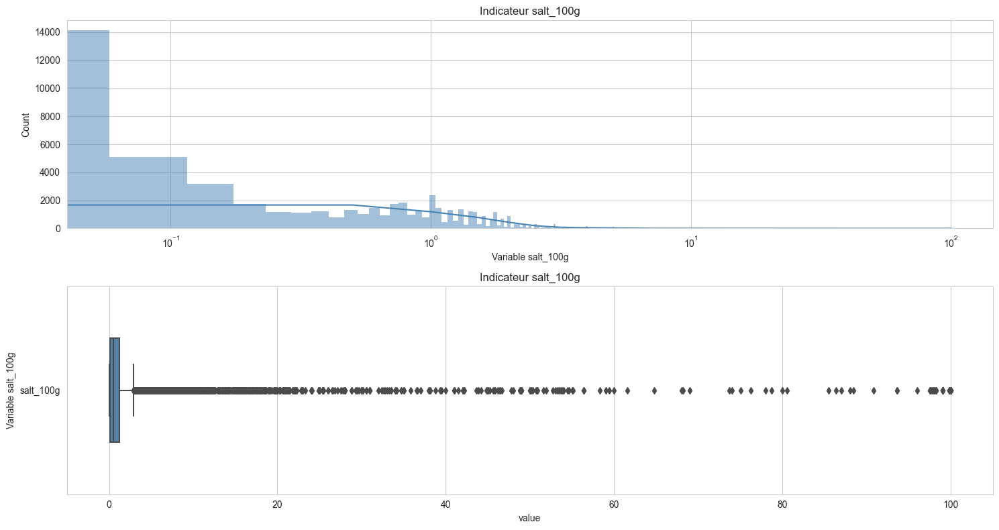

In [20]:
# Indicateur salt_100g
plt.figure(figsize = (15,8))

#Distribution
plt.subplot(2,1,1)
sns.histplot(df_salt['value'], kde = True, color='SteelBlue')
plt.title('Indicateur salt_100g')
plt.xscale('log')
plt.xlabel("Variable salt_100g")

#Boite à moustache
plt.subplot(2,1,2)
sns.boxplot( x=df_salt['value'], y=df_salt['variable'],orient="h", width=0.5, color='SteelBlue')
plt.title('Indicateur salt_100g')
plt.ylabel("Variable salt_100g")

plt.tight_layout()

#### Affichage du graphique PairPlot

La fonction PairPlot créé une grille d'axes de telle sorte que chaque variable numérique des données sera partagée sur l'axe des y sur une seule ligne et sur l'axe des x sur une seule colonne.
Les Axes diagonaux sont traités différemment, en traçant un graphique pour montrer la distribution univariée des données pour la variable dans cette colonne par rapport à celle qui est en ligne.
Ce graphique nous permettra d'aborder l'analyse bi-variée en nous permettant de choisir les paires de variables les plus intéressantes à étudier.

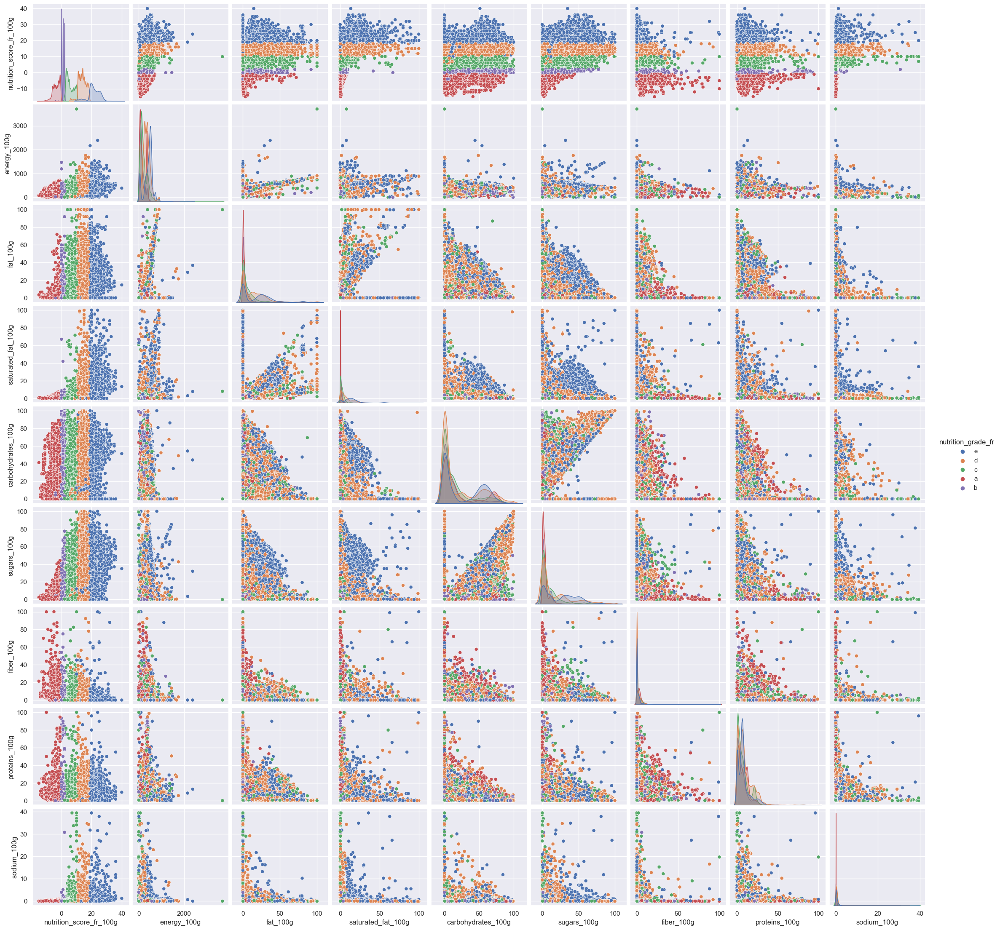

In [99]:
sns.pairplot(data_scores, hue = 'nutrition_grade_fr');

Nous remarquons que les variables salt_100g et sodium_100g sont entièrement corrélées. La raison est la suivante : Le sel est considéré comme un aliment, dont le nom scientifique est le chlorure de sodium (NaCl). Il est constitué de deux minéraux : le sodium (Na), pour 40 %, et le chlorure (Cl) pour 60 %. Pour obtenir un gramme de sel, il faut multiplier la variable sodium par 2,5. Nous sommes donc en présence du même nutriment, et donc de la même variable.
Nous allons supprimer la variable salt sur tous les df.

In [22]:
# Suppression de la variable salt_100g
data_fr.drop(["salt_100g"], axis = 1, inplace = True)
data_scores.drop(["salt_100g"], axis = 1, inplace = True)
data_chiffres.drop(["salt_100g"], axis = 1, inplace = True)

/var/folders/2h/0h36_vhs46g36p7g0wcsfpc40000gn/T/ipykernel_9011/2642872365.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_scores.drop(["salt_100g"], axis = 1, inplace = True)
/var/folders/2h/0h36_vhs46g36p7g0wcsfpc40000gn/T/ipykernel_9011/2642872365.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_chiffres.drop(["salt_100g"], axis = 1, inplace = True)


### Analyse bivariée

#### Table de corrélation

In [23]:
#Affichage de la table de corrélation
data_chiffres.corr()

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
energy_100g,1.00000,0.58072,0.56259,0.36374,0.32466,0.16707,0.20188,-0.02076
fat_100g,0.58072,1.00000,0.54195,0.13325,-0.01302,-0.01294,0.10295,0.00157
saturated_fat_100g,0.56259,0.54195,1.00000,-0.02739,0.08172,-0.01042,0.14581,0.01178
carbohydrates_100g,0.36374,0.13325,-0.02739,1.00000,0.43825,0.13007,-0.10467,-0.07937
sugars_100g,0.32466,-0.01302,0.08172,0.43825,1.00000,0.03198,-0.25029,-0.09263
fiber_100g,0.16707,-0.01294,-0.01042,0.13007,0.03198,1.00000,0.14253,0.00461
proteins_100g,0.20188,0.10295,0.14581,-0.10467,-0.25029,0.14253,1.00000,0.10853
sodium_100g,-0.02076,0.00157,0.01178,-0.07937,-0.09263,0.00461,0.10853,1.00000


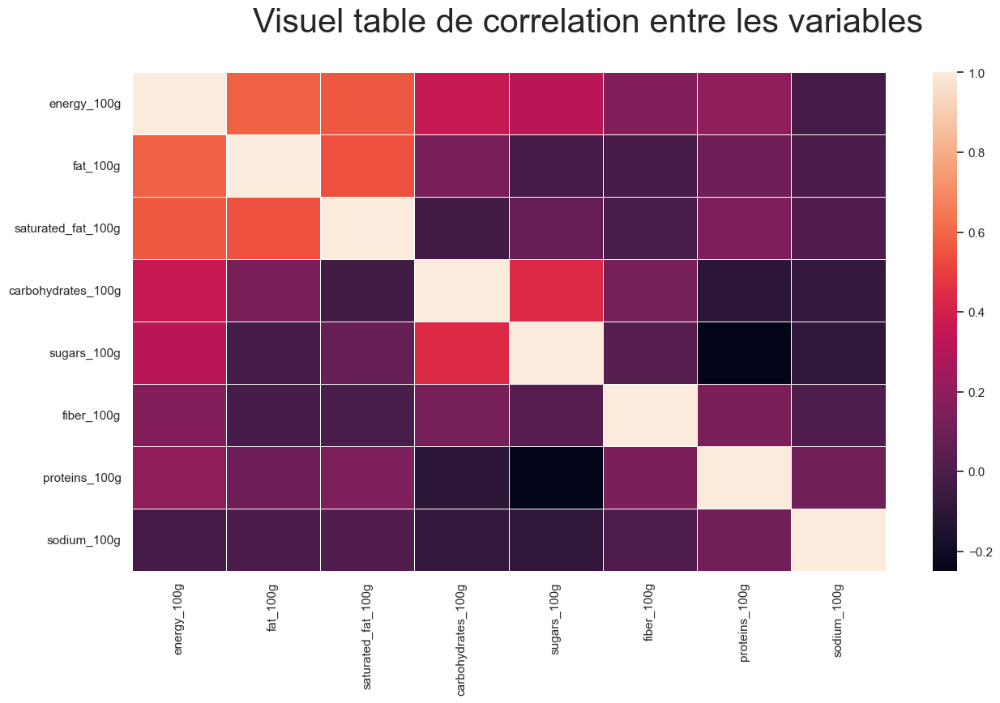

In [24]:
#On donne un aspect graphique à nos valeurs de corrélation
fig = plt.figure(figsize=(15,8))
fig.suptitle('Visuel table de correlation entre les variables', fontsize=30)

data_chiffres.corr()
sns.set(font_scale=1)
ax = sns.heatmap(data_chiffres.corr(), linewidths=.5)

Les données des variables sont très peu corrélées entres elles.
Cependant, la variable energy_100g est très corrélée avec les variables fat_100g (58,07%) et saturated_fat (56,25%).
Les variables fat_100g et saturated_fat_100g sont elles aussi très corrélées (54,2%), la raison est la suivantes :
"Les graisses sont des triglycérides constitués d'une combinaison de différents éléments constitutifs : le glycérol et les acides gras. En fonction de leur structure, les graisses sont considérées comme saturées ou insaturées (mono-insaturées, poly-insaturées ou trans). Source eufic.org".
Une corrélation plus faible est observable entre l'energy_100g et les variables sugars_100g et carbohydrates_100g à des taux respectifs 32,46% et de 36,37%.
Les carbohydrates et le sucre sont eux aussi corrélés avec un taux de corrélation de 43,82 %.
Carbohydrates = glucides. Les glucides sont habituellement répartis entre oses (monosaccharides tels le glucose, le galactose ou le fructose) et osides, qui sont des polymères d'oses (oligosaccharides et polysaccharides). Source Wikipedia


#### Boxplot de corrélation entre le nutrigrade et le nutriscore

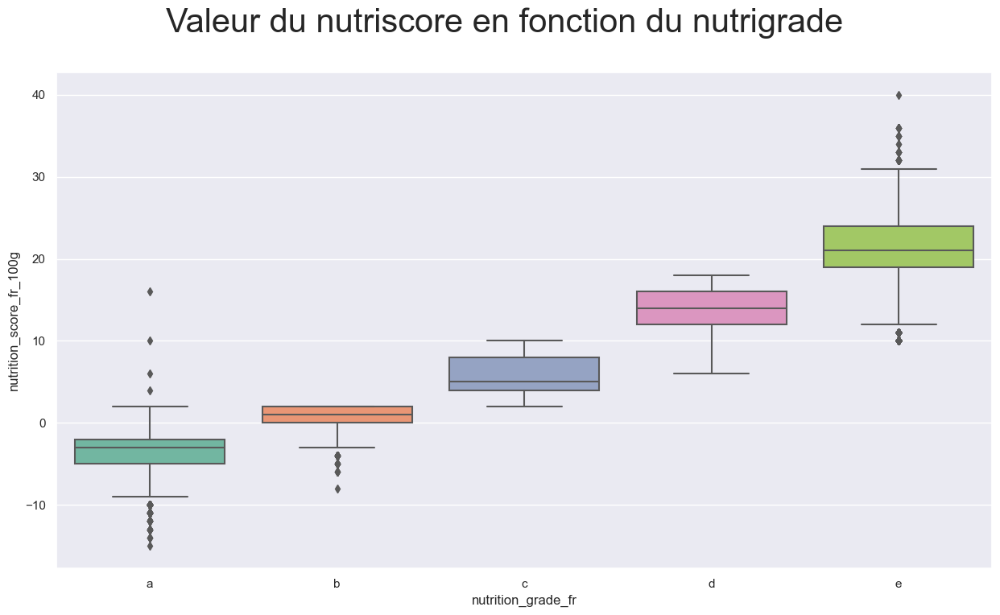

In [25]:
fig = plt.figure(figsize=(15,8))
fig.suptitle('Valeur du nutriscore en fonction du nutrigrade ', fontsize=30)

chart = sns.boxplot(
    data=data_fr,
    x='nutrition_grade_fr',
    y='nutrition_score_fr_100g',
    palette='Set2',
    order=data_fr.nutrition_grade_fr.sort_values().unique()
)

Ce boxplot nous sert simplement à vérifier la cohérence des données renseignés dans notre dataframe entre les valeurs des 'nutrigrade' et 'nutriscore'
Les deux valeurs étant intrinsèquement liées, il est important de vérifier qu'elles sont bien corrélées entre-elles, ce qui est bien le cas ici.

#### Boxplot de corrélation entre les nutriments et le nutrigrade

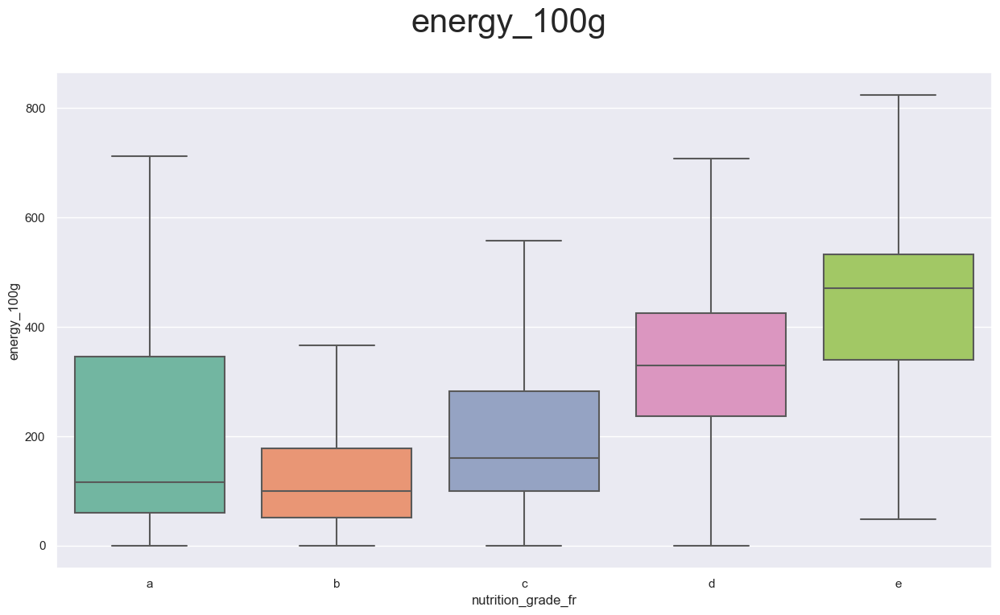

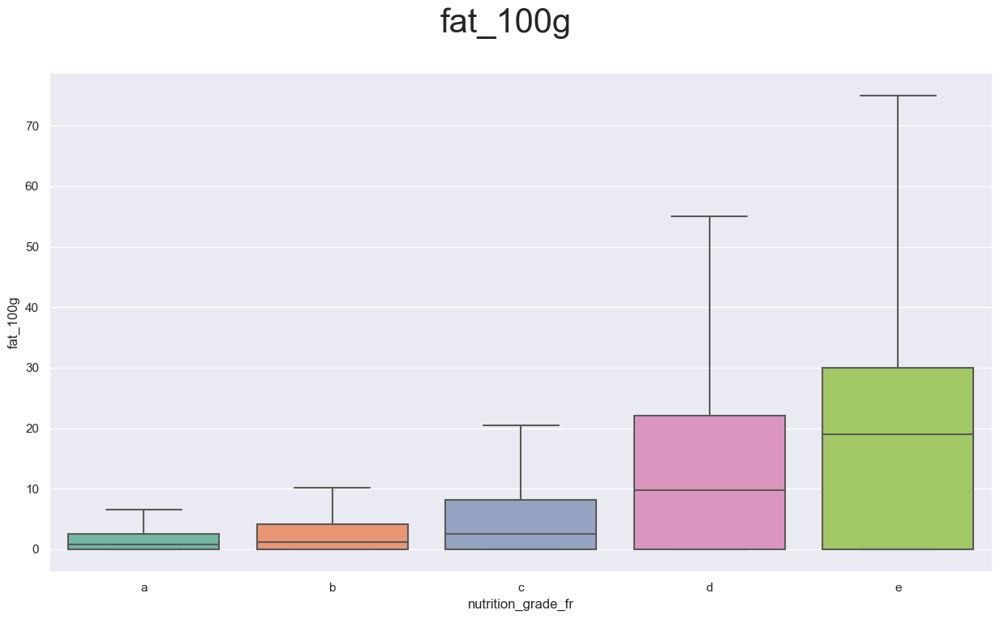

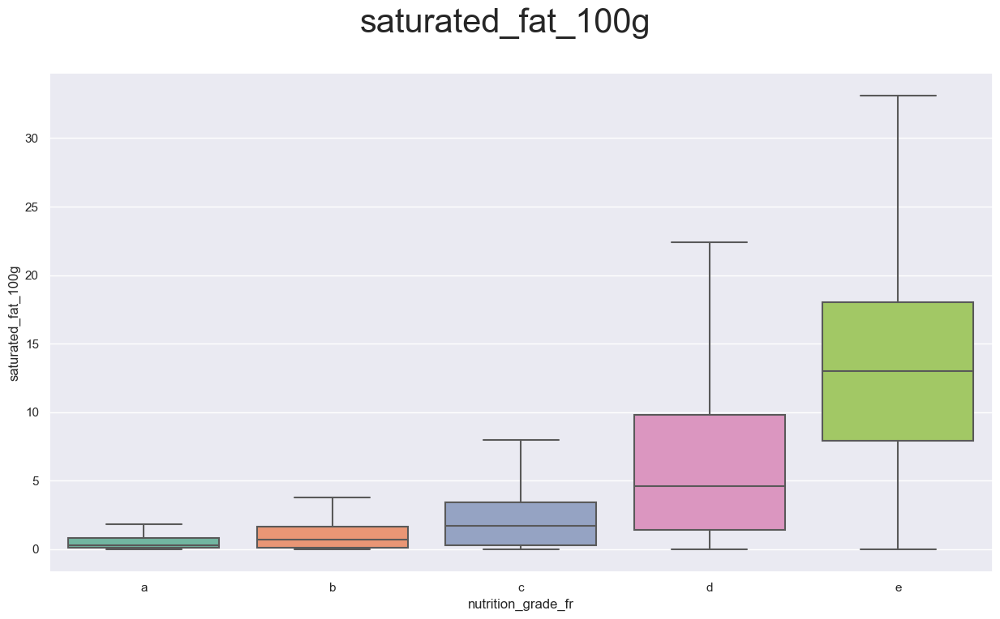

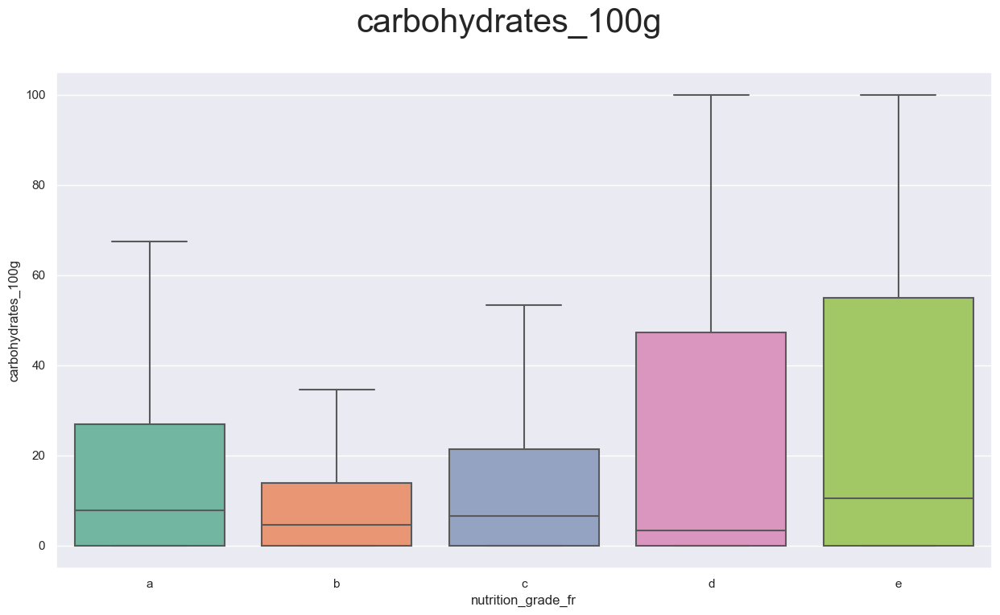

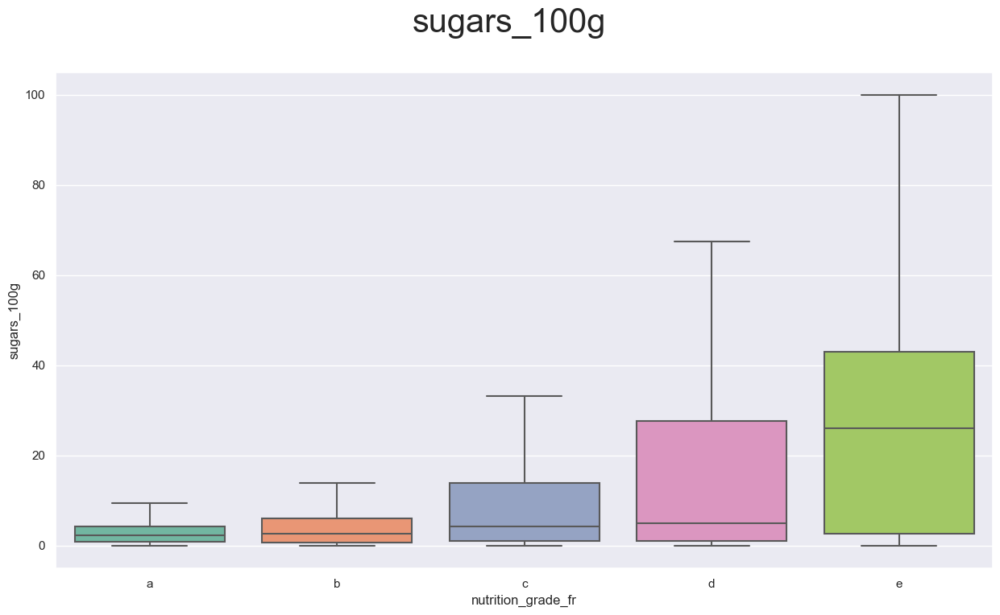

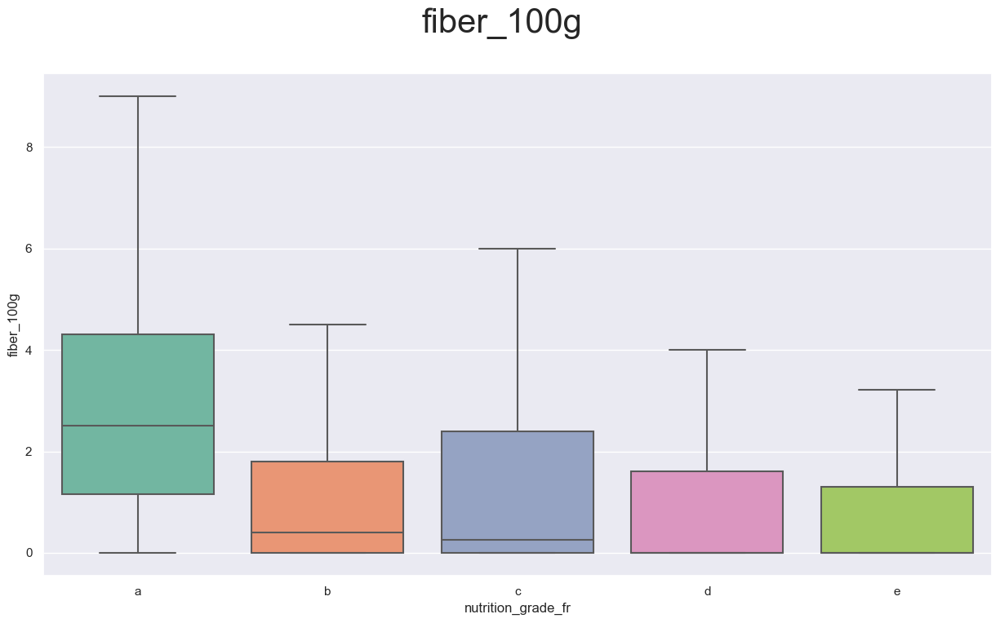

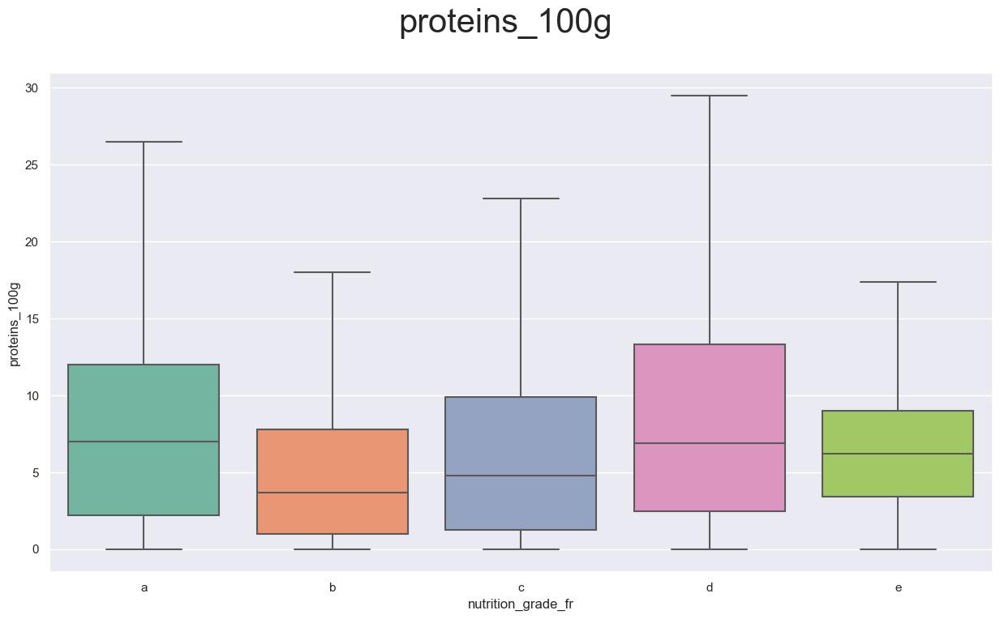

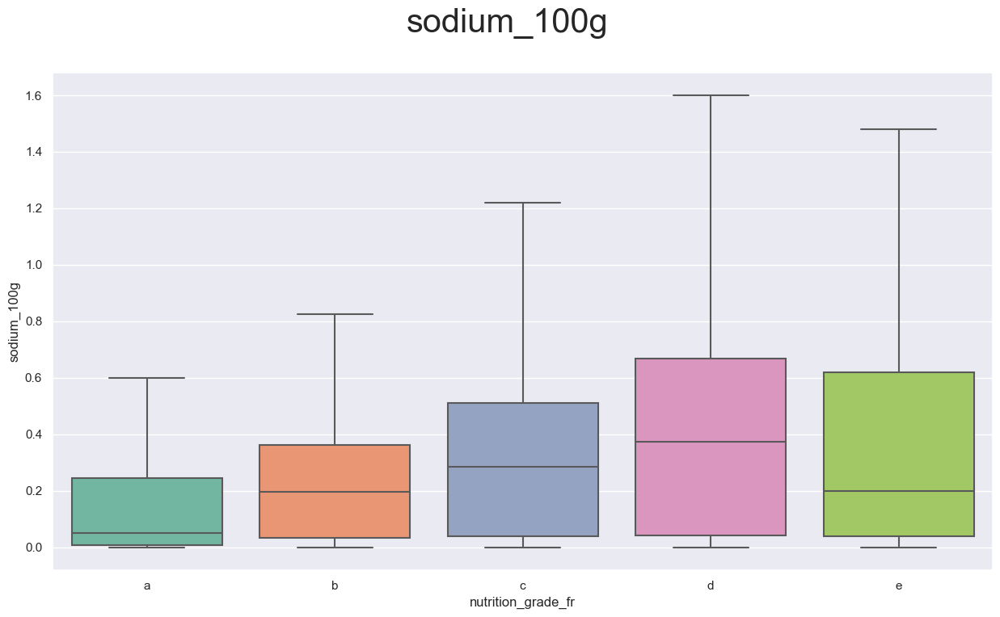

In [26]:
# Nous affichons les boxplots des nutriments en fonction du nutrigrade
for nutriments in data_chiffres_cols:
    fig = plt.figure(figsize=(15,8))
    fig.suptitle(nutriments, fontsize=30)

    chart = sns.boxplot(
        data=data_fr,
        x='nutrition_grade_fr',
        y=nutriments,
        palette='Set2',
        showfliers = False,
        order=data_fr.nutrition_grade_fr.sort_values().unique()
    )

Le nutrigrade est utilisé pour informé les consommateurs sur la qualité nutritionnelle des produits et leur valeur nutritionnelle pour 100 g.

Nous pouvons observer les informations suivantes :

* energy_100g
Il y a une corrélation entre la variable energy_100g et le nutrigrade, avec toutefois une donnée étonnante pour la valeur a qui semble non corrélées avec les autres valeurs. Il est remarquable que cette 'décorrélation' est due aux valeurs minimales et maximales des quartile de la variable. La médiane quant à elle, est dans la corrélation. Cela peut-être du à des abbérants.


* fat_100g et saturated_fat_100g
Les variables fat_100g et saturated_fat_100g sont clairement corrélées à la variable nutrition_grade_fr


* carbohydrates_100g
Nous pouvons observer les mêmes caractéristiques pour cette variable que pour la variable energy_100g


* sugar_100g
La variable est fortement corrélée au nutrition grade. La valeur augmente fortement avec la dégradation du nutrigrade


* fiber_100g
Nous observons une corrélation inversée entre le nutrition grade et fiber_100g. Les valeurs 'a' et 'c' sont anormalement marquées par rapport aux autres.


* proteins_100g
Il n'est pas possible d'établir une corrélation sur cette variable.


* sodium_100g
La variable est fortement corrélée au nutrition grade. La valeur augmente fortement avec la dégradation du nutrigrade. La valeur 'd' est anormalement basse par rapport aux autres.


Nous observons une corrélation entre les variables et le nutrigrade. Nous pouvons donc déduire qu'il y a un lien entre le nutriscore et les variables de nutriments.


#### ANOVA

In [27]:
data_scores.head()

,nutrition_score_fr_100g,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
0,22.0,e,450.04780,20.0,12.5,70.0,57.5,2.5,2.5,0.03800
1,14.0,d,418.97706,0.0,0.8,0.0,87.7,0.9,0.6,0.00394
2,14.0,d,575.04780,0.0,2.9,0.0,50.3,3.9,9.5,0.00118
3,13.0,e,42.30402,0.0,0.0,10.4,10.4,0.0,0.0,0.01000
4,15.0,d,257.88719,0.0,11.0,0.0,1.0,1.4,7.5,0.31496


##### ANOVA à 2 facteurs

L'ANOVA à deux facteurs nous permet de verifier si la variable energy_100g à une influence sur le nutrition_grade_fr

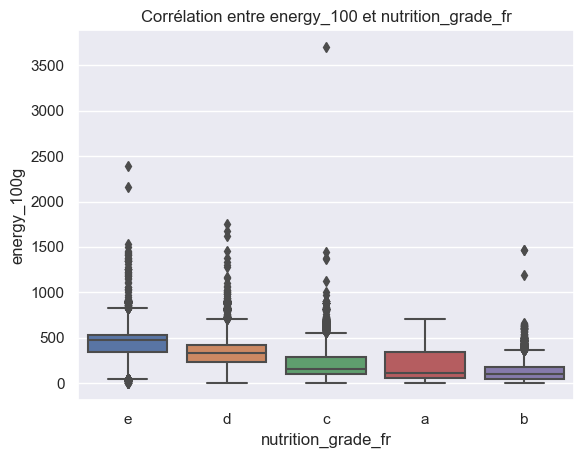

In [28]:
# On affiche le graphique de corrélation entre le nutrition grade et l'energie.
ax = sns.boxplot(x="nutrition_grade_fr", y="energy_100g", data=data_scores)
plt.xlabel("nutrition_grade_fr")
plt.ylabel("energy_100g")
plt.title('Corrélation entre energy_100 et nutrition_grade_fr')
plt.show()

Les boîtes à moustaches ne sont pas très distinctes, même s'il y a un peu de variance.
Nous allons vérifier la relation avec l'ANOVA.


In [29]:
#Traçage du tableau ANOVA
anova_nutrition = smf.ols('energy_100g~nutrition_grade_fr', data=data_scores).fit()
print(anova_nutrition.summary())

                            OLS Regression Results                            
Dep. Variable:            energy_100g   R-squared:                       0.318
Model:                            OLS   Adj. R-squared:                  0.318
Method:                 Least Squares   F-statistic:                     7058.
Date:                Wed, 08 Feb 2023   Prob (F-statistic):               0.00
Time:                        08:59:23   Log-Likelihood:            -3.9075e+05
No. Observations:               60451   AIC:                         7.815e+05
Df Residuals:                   60446   BIC:                         7.815e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

Nous pouvons observer une très forte corrélation entre la variable energy et la variable nutrition_grade.
Le F-statistic est à 7058 et le prob (fisher) est à 0. Nous pouvons donc rejeter l'hypothèse nulles.
Nous allons le vérifier en lançant un test de Fisher

##### Test de Fisher

In [30]:
# Test de fisher
sm.stats.anova_lm(anova_nutrition, typ=2)

,sum_sq,df,F,PR(>F)
nutrition_grade_fr,6.80368e+08,4.0,7058.09527,0.0
Residual,1.45668e+09,60446.0,NaN,NaN


Le test de Fisher confirme l'ANOVA. La variable energy_100g à donc une influence sur le nutri_score

Nous allons vérifier avec l'ETA carré :

#### ETA CARRE

In [31]:
#Création du df pour la réalisation du ETA^2
nutri_grade = data_scores[data_scores.nutrition_grade_fr == "a"]

In [32]:
#Création des variables
X =  'nutrition_grade_fr' # qualitative
Y = "energy_100g" # quantitative

# On crée le sous-échantillon (pas de filtre particulier ici)
sous_echantillon = data_scores.copy()

In [33]:
# Calcul du rapport de corrélation eta carré pour affichage
def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT

In [34]:
eta_squared(sous_echantillon[X],sous_echantillon[Y])

0.3183682508829425

Nous retrouvons l'influence notée précédemment, même si celle-ci est moindre que ce que nous pensions.

##### Affichage de la corrélation en nutrition grade et energy

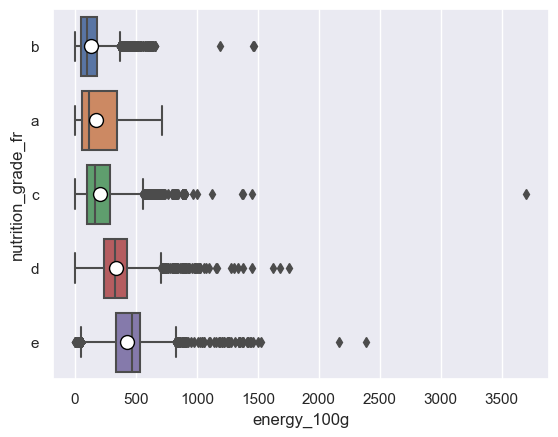

le rapport de corrélation eta carré est égal à (0 pas de relation - 1 forte correlation) :  0.32


In [35]:
# On se prépare à classer les boxplot
my_order = sous_echantillon.groupby(by=[X])[Y].median().sort_values().iloc[::1].index


# On affiche les boxplots
sns.boxplot(x=Y, y=X, showmeans=True, data=sous_echantillon, order=my_order, \
            meanprops={"marker":"o",
                       "markerfacecolor":"white",
                       "markeredgecolor":"black",
                       "markersize":"10"})

plt.show()

print('le rapport de corrélation eta carré est égal à (0 pas de relation - 1 forte correlation) : ' , \
      round(eta_squared(sous_echantillon[X],sous_echantillon[Y]),2))

Nous avons effectivement une corrélation entre les variables energy et nutrition_score.

#### CHI2

Le CHI 2 nous permet d'étudier la corrélation entre 2 variables.

In [36]:
data_scores.head(5)

,nutrition_score_fr_100g,nutrition_grade_fr,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
0,22.0,e,450.04780,20.0,12.5,70.0,57.5,2.5,2.5,0.03800
1,14.0,d,418.97706,0.0,0.8,0.0,87.7,0.9,0.6,0.00394
2,14.0,d,575.04780,0.0,2.9,0.0,50.3,3.9,9.5,0.00118
3,13.0,e,42.30402,0.0,0.0,10.4,10.4,0.0,0.0,0.01000
4,15.0,d,257.88719,0.0,11.0,0.0,1.0,1.4,7.5,0.31496


In [37]:
#Table croisée sur la variable energy_100g
pd.crosstab(data_scores['nutrition_grade_fr'], data_scores['energy_100g'])

energy_100g,0.00000,0.14340,0.21511,0.21989,0.23901,0.31071,0.33461,0.38241,0.40631,0.43021,0.44192,0.47801,0.50669,0.57361,0.69312,0.71702,0.81262,0.83652,0.95602,0.97992,1.00382,1.02772,1.07553,1.12333,1.19503,1.21893,1.24283,1.36233,1.38623,1.43403,1.55354,1.57744,1.62285,1.62524,1.67304,1.72084,1.88815,1.91205,2.15105,2.34226,2.39006,2.62906,2.86807,2.89197,3.10707,3.29828,3.34608,3.46558,3.65679,3.99140,4.01530,4.06310,4.54111,4.78011,5.01912,5.25813,5.49713,5.97514,6.21415,6.45315,6.69216,6.93117,7.17017,7.40918,7.50478,7.64818,7.88719,8.03059,8.12620,8.16683,8.60421,9.08222,9.56023,9.58413,9.79924,10.03824,10.27725,10.51625,10.75526,10.99426,11.30497,11.47228,11.71128,11.95029,12.18929,12.42830,12.66730,12.90631,13.14532,13.34130,13.38432,13.62333,13.86233,14.10134,14.26147,14.26864,14.34034,14.57935,14.81836,15.05736,15.29637,15.35612,15.53537,15.77438,16.01338,16.25239,16.49140,16.58700,16.73040,16.76147,16.96941,17.08891,17.20841,17.23231,17.44742,17.59082,17.66252,17.68642,17.82983,17.92543,18.04493,18.16444,18.18834,18.40344,18.64245,18.69025,18.88145,18.92925,19.00096,19.12046,19.33556,19.35946,19.55067,19.59847,19.76577,19.83748,20.07648,20.19598,20.31549,20.55449,20.67400,20.79350,21.03250,21.27151,21.37906,21.51052,21.74952,21.83795,21.84512,21.98853,...,804.01530,804.73231,806.88337,807.36138,807.83939,808.07839,808.31740,809.03442,809.27342,809.99044,810.22945,810.94646,812.61950,813.57553,814.05354,816.20459,818.11663,818.59465,819.07266,820.02868,821.94073,822.41874,822.89675,824.09178,824.33078,825.04780,826.00382,826.95985,827.91587,830.06692,831.02294,833.89101,835.08604,836.99809,838.91013,841.06119,843.92925,844.88528,846.08031,853.96750,856.11855,858.03059,862.09369,864.00574,864.96176,869.02486,875.95602,879.06310,880.97514,882.17017,882.64818,882.88719,883.36520,884.08222,884.32122,885.03824,885.99426,886.95029,892.92543,893.88145,895.79350,896.03250,897.94455,898.66157,898.90057,900.09560,900.57361,901.05163,901.52964,902.00765,916.10899,919.93308,928.05927,933.07839,934.03442,934.99044,951.00382,956.02294,969.88528,972.99235,978.01147,983.98662,985.89866,994.02486,1000.00000,1003.10707,1005.97514,1007.88719,1020.07648,1023.90057,1025.09560,1028.91969,1041.10899,1054.01530,1055.92734,1059.03442,1071.94073,1099.90440,1101.09943,1110.89866,1123.08795,1143.88145,1153.91969,1157.02677,1167.06501,1178.05927,1180.92734,1189.05354,1191.92161,1206.97897,1207.93499,1218.92925,1219.88528,1244.02486,1254.06310,1257.88719,1259.08222,1260.03824,1277.96367,1280.11472,1303.05927,1309.99044,1337.95411,1341.06119,1342.97323,1348.94837,1351.09943,1367.11281,1369.98088,1374.04398,1378.10707,1380.01912,1411.08987,1416.10899,1419.93308,1438.09751,1445.02868,1449.09178,1450.04780,1460.08604,1461.99809,1466.06119,1498.08795,1527.96367,1625.95602,1679.97132,1754.06310,2163.00191,2385.99426,3700.04780
nutrition_grade_fr,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
a,50,0,0,0,4,0,0,0,0,0,0,2,0,0,0,1,0,0,15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,2,1,0,5,0,1,1,0,0,0,1,0,0,0,0,3,0,0,1,1,4,1,1,2,3,2,0,0,2,0,0,0,8,4,2,7,8,3,0,5,3,4,17,0,1,9,5,4,13,9,1,5,4,11,2,10,0,5,0,13,0,6,0,4,1,1,8,1,26,0,6,0,6,9,0,11,1,1,7,1,10,0,14,0,5,22,1,3,7,0,5,18,11,0,9,5,0,0,30,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
b,245,1,1,1,20,1,14,1,2,1,0,23,1,0,0,12,0,1,66,0,1,1,1,1,9,1,1,1,2,3,2,1,1,0,0,0,0,11,1,0,2,0,1,0,9,0,2,0,0,1,2,38,2,1,10,0,0,2,1,0,0,3,0,1,0,0,4,1,0,0,0,4,0,0,0,4,4,2,0,4,0,0,0,7,2,2,6,5,3,1,2,1,0,9,0,

In [38]:
# On calcul le CHI2 du nutriton_grade en fonction de l'energy_100g
def CHI2 (serie1, serie2):
    tab_cont = pd.crosstab(serie1.array, serie2.array)
    chi2, p, dof, expected_table = chi2_contingency(tab_cont.values)
    print(f'chi2 = {chi2}, p-value = {p}, degrees of liberty = {dof}')

In [39]:
CHI2(data_scores.nutrition_grade_fr, data_scores.nutrition_score_fr_100g)

chi2 = 220638.58194315791, p-value = 0.0, degrees of liberty = 208


In [40]:
data_scores.columns

Index(['nutrition_score_fr_100g', 'nutrition_grade_fr', 'energy_100g',
       'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'sodium_100g'],
      dtype='object')

In [41]:
# On calcul le chi2 pour chaque variable
import seaborn as sns
x = pd.cut(data_scores['nutrition_score_fr_100g'], 3)

for column in list(data_scores.select_dtypes(include = ['int32','float64']).columns):
    print('test chi2 {} / {}'.format('nutrition_score_fr_100g',column))
    if data_scores[column].nunique() > 3:
        y = pd.cut(data_scores[column], 3).astype('category')

    else:
        y = data_scores[column].astype('category')

    CHI2(x, y)

    print('---------------------------\n')

test chi2 nutrition_score_fr_100g / nutrition_score_fr_100g
chi2 = 120902.0, p-value = 0.0, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / energy_100g
chi2 = 55.575267687988834, p-value = 2.461443812568697e-11, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / fat_100g
chi2 = 3954.6517593317235, p-value = 0.0, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / saturated_fat_100g
chi2 = 1111.053770584815, p-value = 3.042463089330205e-239, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / carbohydrates_100g
chi2 = 5289.966126616125, p-value = 0.0, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / sugars_100g
chi2 = 13198.218959182646, p-value = 0.0, degrees of liberty = 4
---------------------------

test chi2 nutrition_score_fr_100g / fiber_100g
chi2 = 36.92465271968387, p-value = 1.866845123644709

nutrition_score_fr_100g / energy_100g : p-value = 2.461443812568697e-11 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
nutrition_score_fr_100g / fat_100g : P value nulle alors les variables sont dépendantes
nutrition_score_fr_100g / saturated_fat_100g : p-value = 3.042463089330205e-239 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
nutrition_score_fr_100g / carbohydrates_100g : P value nulle alors les variable sont dépendante
nutrition_score_fr_100g / sugars_100g : P value nulle alors les variable sont dépendante
nutrition_score_fr_100g / fiber_100g : p-value = 1.866845123644709e-07 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
nutrition_score_fr_100g / proteins_100g : p-value = 2.702190049521886e-11 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables
nutrition_score_fr_100g / sodium_100g : p-value = 7.26054543175058e-18 est bien inférieur à 0.5, nous pouvons considérer qu'il y a une dépendance entre les variables

Le test Chi2 nous permet d'établir une corrélation entre les variables et le nutrition score.


##### Table de corrélation CHI2

###### Valeur du Pnns en fonction du nutrigrade

La table de corrélation nous présente le total des valeurs en fonction de leur valeur. Les NAN sont induits par la mise en tableau croisé. Les valeurs NAN sont de vrais valeurs vides. Nous pouvons donc les convertir en 0

In [42]:
X = "pnns_groups_2" # qualitative
Y = "nutrition_grade_fr" # quantitative

In [43]:
cont_pnns = data_appli[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
cont_pnns

nutrition_grade_fr,a,b,c,d,e,Total
pnns_groups_2,,,,,,
Alcoholic beverages,NaN,2.0,2.0,29.0,13.0,46
Appetizers,17.0,53.0,396.0,692.0,249.0,1407
Artificially sweetened beverages,NaN,63.0,66.0,33.0,16.0,178
Autres,3065.0,3564.0,4595.0,5915.0,4037.0,21176
Biscuits and cakes,21.0,29.0,205.0,1187.0,1760.0,3202
Bread,357.0,288.0,297.0,131.0,18.0,1091
Breakfast cereals,192.0,92.0,439.0,281.0,9.0,1013
Cereals,1632.0,384.0,273.0,175.0,33.0,2497
Cheese,107.0,61.0,234.0,1668.0,125.0,2195


In [44]:
cont_pnns.fillna(0)

nutrition_grade_fr,a,b,c,d,e,Total
pnns_groups_2,,,,,,
Alcoholic beverages,0.0,2.0,2.0,29.0,13.0,46
Appetizers,17.0,53.0,396.0,692.0,249.0,1407
Artificially sweetened beverages,0.0,63.0,66.0,33.0,16.0,178
Autres,3065.0,3564.0,4595.0,5915.0,4037.0,21176
Biscuits and cakes,21.0,29.0,205.0,1187.0,1760.0,3202
Bread,357.0,288.0,297.0,131.0,18.0,1091
Breakfast cereals,192.0,92.0,439.0,281.0,9.0,1013
Cereals,1632.0,384.0,273.0,175.0,33.0,2497
Cheese,107.0,61.0,234.0,1668.0,125.0,2195


##### Affichage de la table de corrélation

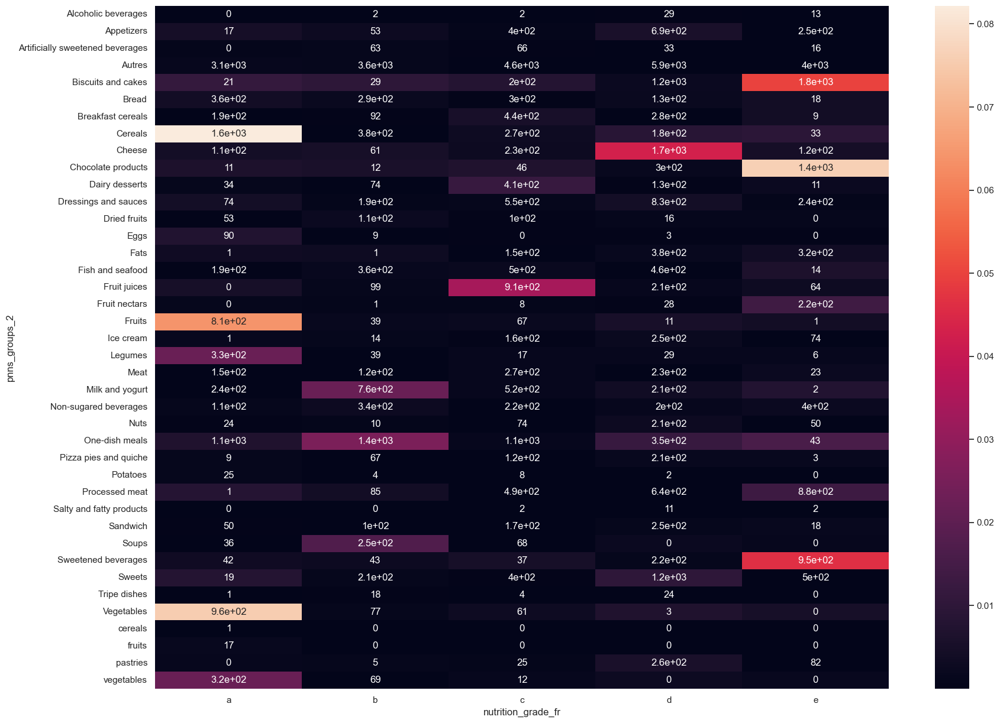

In [45]:
fig = plt.figure(figsize=(20,15))

tx = cont_pnns.loc[:,["Total"]]
ty = cont_pnns.loc[["Total"],:]
n = len(data_fr)
indep = tx.dot(ty) / n

c = cont_pnns.fillna(0) # On remplace les valeurs nulles par 0
measure = (c-indep)**2/indep
xi_n = measure.sum().sum()
table = measure/xi_n
sns.heatmap(table.iloc[:-1,:-1],annot=c.iloc[:-1,:-1])
plt.show()

### Analyse multivariée

#### KMEAN

#### Préparation du jeu de données

##### Data

Chargement des tables de données

In [46]:
X = data_Kmean

In [47]:
X.head()

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
0,450.04780,20.0,12.5,70.0,57.5,2.5,2.5,0.03800
1,418.97706,0.0,0.8,0.0,87.7,0.9,0.6,0.00394
2,575.04780,0.0,2.9,0.0,50.3,3.9,9.5,0.00118
3,42.30402,0.0,0.0,10.4,10.4,0.0,0.0,0.01000
4,257.88719,0.0,11.0,0.0,1.0,1.4,7.5,0.31496


#### Instanciation et fitting

##### Instanciation du Kmean

In [48]:
kmeans = KMeans(n_clusters=4)

##### Entrainement

In [49]:
kmeans.fit(X)

/Users/xparisot/opt/anaconda3/envs/ProjectOPC/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


KMeans(n_clusters=4)

##### Labels et centroids

###### Enregistrement des labels et des centroids

In [50]:
labels = kmeans.labels_

In [51]:
centroids = kmeans.cluster_centers_
centroids

array([[9.27862694e+01, 2.56525267e+00, 1.38579471e+00, 7.33919517e+00,
        5.99241925e+00, 1.05616569e+00, 5.39275440e+00, 4.17622321e-01],
       [4.92495865e+02, 1.99549725e+01, 1.11710766e+01, 3.68850026e+01,
        2.64927139e+01, 2.89249032e+00, 8.55435344e+00, 3.66300759e-01],
       [3.08433856e+02, 8.49845029e+00, 5.37749061e+00, 2.66777068e+01,
        1.51641347e+01, 2.26604698e+00, 1.05390782e+01, 4.82476394e-01],
       [7.80785200e+02, 4.91411307e+01, 2.46733104e+01, 2.34176319e+00,
        3.29399309e+00, 1.41902638e+00, 4.72629209e+00, 2.86543022e-01]])

#### Projection par le biais d'une PCA

##### Scaling et entrainement des données

Instanciation du scaler

In [52]:
scaler = StandardScaler()

Entrainement et transformation

In [53]:
X_scaled = scaler.fit_transform(X)
X_scaled[:10]

array([[ 0.96688583,  0.69136363,  0.83197737,  1.90712782,  2.32679454,
         0.15781796, -0.66901526, -0.26542055],
       [ 0.80163401, -0.62638789, -0.54466097, -0.76031396,  3.919204  ,
        -0.23700211, -0.91124451, -0.28882451],
       [ 1.63170664, -0.62638789, -0.29757204, -0.76031396,  1.94714726,
         0.50328552,  0.2234083 , -0.29071803],
       [-1.20172658, -0.62638789, -0.63879009, -0.36400833, -0.15673146,
        -0.4590884 , -0.98773795, -0.28465875],
       [-0.05513315, -0.62638789,  0.65548527, -0.76031396, -0.65238208,
        -0.11362084, -0.03156986, -0.07512678],
       [-1.20172658, -0.62638789, -0.63879009, -0.36400833, -0.15673146,
        -0.4590884 , -0.98773795, -0.26447919],
       [ 0.98849569,  0.88902635, -0.3446366 ,  1.33553315,  0.66583766,
        -0.08894459, -0.22280348, -0.11299726],
       [ 0.82070153,  0.62547605, -0.3446366 ,  1.37363946,  0.77129524,
        -0.01491582, -0.2483013 , -0.11570229],
       [ 0.69612707,  0.36192575

##### Debut de la PCA

In [54]:
# instanciation et entrainement de la PCA
pca = PCA(n_components=4)
pca.fit(X_scaled)

PCA(n_components=4)

In [55]:
# Calcul de la variance cumulée
pca.explained_variance_ratio_.cumsum()

array([0.2900215 , 0.48983058, 0.63277119, 0.75212414])

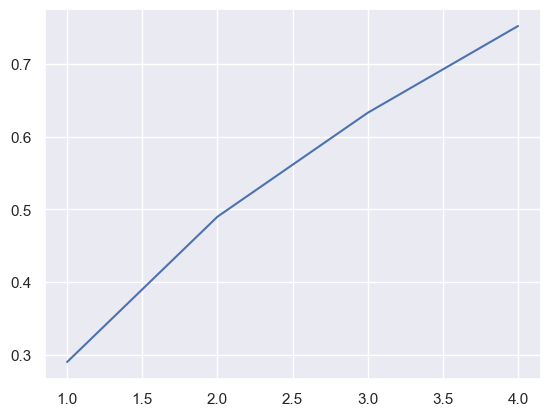

In [56]:
# Visualisation
plt.plot(range(1,5), pca.explained_variance_ratio_.cumsum())
#plt.xlabel = "n_components"
#plt.ylabel = "% of variance"
plt.show()

Il est notable que nous avons une inertie très faible entre les clusters

##### Projection

In [57]:
# Calcul des coordonnées des individus
X_proj = pca.transform(X_scaled)
X_proj[:10]

array([[ 2.38946765, -2.3057655 , -0.1366542 ,  0.4531174 ],
       [ 0.53333386, -2.65701369, -0.52049174,  0.59544444],
       [ 0.87756726, -0.94617498,  0.56315152, -0.09354573],
       [-1.63825416, -0.56361693, -0.69702534, -0.09858788],
       [-0.42586622,  0.76613487, -0.30576917, -0.25455692],
       [-1.6388387 , -0.55862327, -0.69284457, -0.0796564 ],
       [ 1.3805001 , -1.0789047 ,  0.05178714,  0.22472037],
       [ 1.19345034, -1.23484953,  0.15423849,  0.23780611],
       [ 1.06213584, -1.62555548,  0.14311154,  0.34140629],
       [ 1.94187995, -1.04436968, -0.07692231,  0.2517108 ]])

In [58]:
# DF des coordonnées
X_proj = pd.DataFrame(X_proj, columns = ["F1", "F2", "F3", "F4"])
X_proj[:10]

,F1,F2,F3,F4
0,2.38947,-2.30577,-0.13665,0.45312
1,0.53333,-2.65701,-0.52049,0.59544
2,0.87757,-0.94617,0.56315,-0.09355
3,-1.63825,-0.56362,-0.69703,-0.09859
4,-0.42587,0.76613,-0.30577,-0.25456
5,-1.63884,-0.55862,-0.69284,-0.07966
6,1.38050,-1.07890,0.05179,0.22472
7,1.19345,-1.23485,0.15424,0.23781
8,1.06214,-1.62556,0.14311,0.34141
9,1.94188,-1.04437,-0.07692,0.25171


##### Calcul des Centroids

In [59]:
#scaling des centroids
centroids_scaled = scaler.fit_transform(centroids)
centroids_scaled

array([[-1.29069232, -0.9747896 , -1.05162909, -0.78051887, -0.74268188,
        -1.18698969, -0.80860342,  0.4098178 ],
       [ 0.29261128, -0.00474038,  0.05892024,  1.32134452,  1.51511188,
         1.37054133,  0.52961185, -0.30589685],
       [-0.43648315, -0.64381855, -0.59860431,  0.59520625,  0.26744223,
         0.49806582,  1.3696896 ,  1.31425267],
       [ 1.4345642 ,  1.62334853,  1.59131315, -1.1360319 , -1.03987223,
        -0.68161746, -1.09069803, -1.41817362]])

In [60]:
# DF des centroids
centroids_proj = pca.transform(centroids_scaled)
centroids_proj = pd.DataFrame(centroids_proj,
                              columns = ["F1", "F2", "F3","F4"],
                              index=["cluster_0", "cluster_1", "cluster_2", "cluster_3"])
centroids_proj

,F1,F2,F3,F4
cluster_0,-2.40818,0.07450,-0.93657,0.54840
cluster_1,1.19011,-1.40166,1.50492,-0.21416
cluster_2,-0.43804,0.18655,1.66305,1.09171
cluster_3,1.65611,1.14061,-2.23139,-1.42596


##### Visualisations

###### Visualisation simple

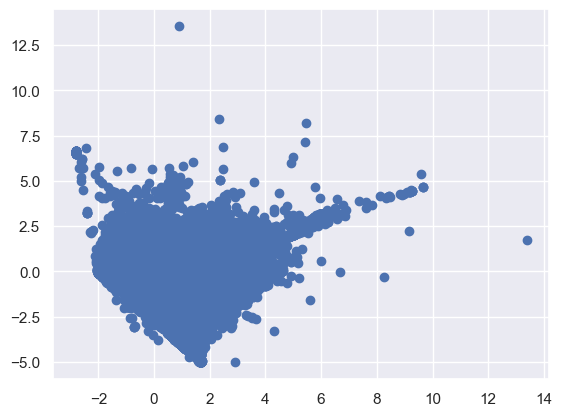

In [61]:
plt.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1]);

La visualisation est cohérente avec le graphique de la variance, il n'y a pas d'indépendance marquée des valeurs.

###### Visualisation des clusters

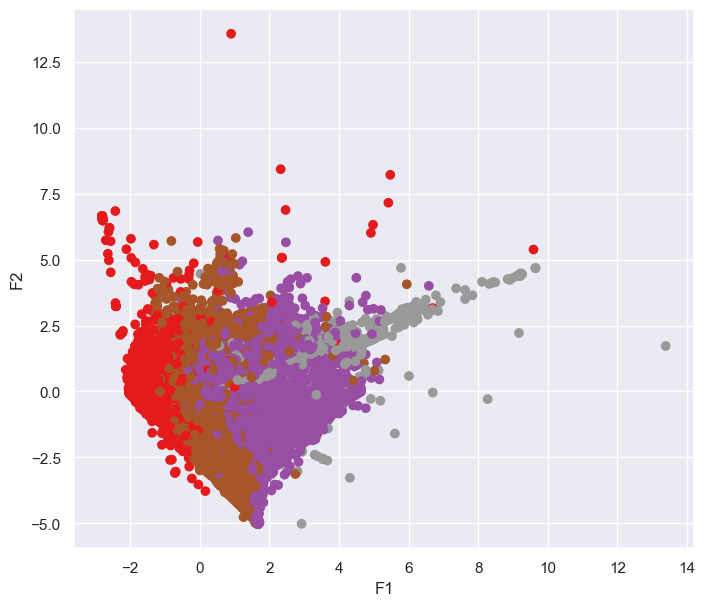

In [62]:
fig, ax = plt.subplots(1,1, figsize=(8,7))

ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c= labels, cmap="Set1")

ax.set_xlabel("F1")
ax.set_ylabel("F2");


###### Visualisation des centroids

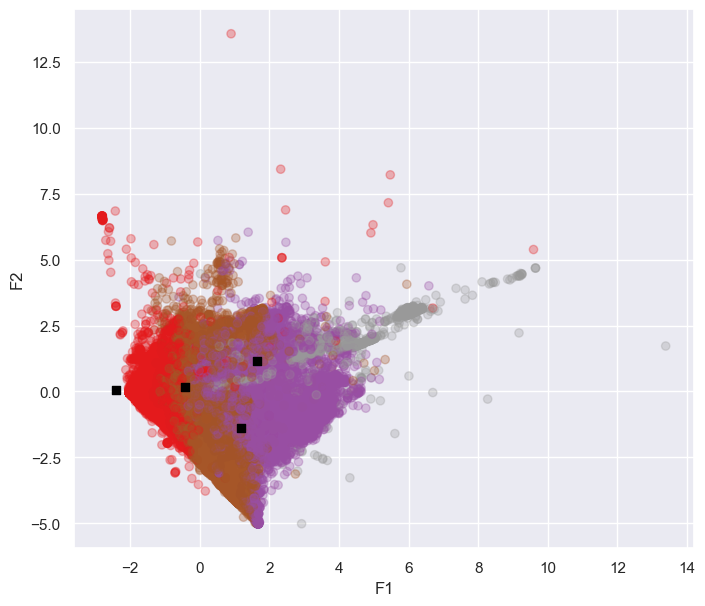

In [63]:
fig, ax = plt.subplots(1,1, figsize=(8,7))

ax.scatter(X_proj.iloc[:, 0], X_proj.iloc[:, 1], c= labels, cmap="Set1", alpha=0.3)
ax.scatter(centroids_proj.iloc[:, 0], centroids_proj.iloc[:, 1],  marker="s", c="black" )

ax.set_xlabel("F1")
ax.set_ylabel("F2");

###### Visualisation 3D

In [64]:
fig = px.scatter_3d(x=X_proj.iloc[:,0], y=X_proj.iloc[:,1], z=X_proj.iloc[:, 2],
                    color=labels)
fig.show()

Les valeurs n'on quasiment pas d'indépendance entre elles, elles sont très fortement imbriquées, cela nous permet de penser qu'il existe une corrélation entre elles.

#### PCA

#### Préparation du jeu de données

In [65]:
data_proj = data_fr[["pnns_groups_2", "nutrition_grade_fr","nutrition_score_fr_100g", "energy_100g", "fat_100g", "saturated_fat_100g", "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "sodium_100g"]]

##### Data Split

###### Séparation des données

In [66]:
#Création de la variable qui contient les colonnes
features = data_chiffres.columns

In [67]:
#Création de X la matrice de données
X = data_chiffres
keep_ind = X.index
X[:9]

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
0,450.04780,20.0,12.5,70.0,57.5,2.5,2.5,0.03800
1,418.97706,0.0,0.8,0.0,87.7,0.9,0.6,0.00394
2,575.04780,0.0,2.9,0.0,50.3,3.9,9.5,0.00118
3,42.30402,0.0,0.0,10.4,10.4,0.0,0.0,0.01000
4,257.88719,0.0,11.0,0.0,1.0,1.4,7.5,0.31496
5,42.30402,0.0,0.0,10.4,10.4,0.0,0.0,0.03937
6,454.11090,23.0,2.5,55.0,26.0,1.5,6.0,0.25984
7,422.56214,19.0,2.5,56.0,28.0,1.8,5.8,0.25591
8,399.13958,15.0,2.0,60.0,34.0,1.5,4.9,0.23622


In [68]:
#vérification du type : array
type(X)

pandas.core.frame.DataFrame

In [69]:
X.shape

(60451, 8)

In [70]:
nutrigrade = data_proj['nutrition_grade_fr']

#### Scalling

In [71]:
#Scalling des données
scaller = StandardScaler()

In [72]:
# Fit et transformation des données
scaller.fit(X)
X_scaled = scaller.transform(X)
X_scaled[:5]

array([[ 0.96688583,  0.69136363,  0.83197737,  1.90712782,  2.32679454,
         0.15781796, -0.66901526, -0.26542055],
       [ 0.80163401, -0.62638789, -0.54466097, -0.76031396,  3.919204  ,
        -0.23700211, -0.91124451, -0.28882451],
       [ 1.63170664, -0.62638789, -0.29757204, -0.76031396,  1.94714726,
         0.50328552,  0.2234083 , -0.29071803],
       [-1.20172658, -0.62638789, -0.63879009, -0.36400833, -0.15673146,
        -0.4590884 , -0.98773795, -0.28465875],
       [-0.05513315, -0.62638789,  0.65548527, -0.76031396, -0.65238208,
        -0.11362084, -0.03156986, -0.07512678]])

In [73]:
#Verification de la moyennes et de l'écart-type
idx = ["mean", "std"]

pd.DataFrame(X_scaled).describe().round(2).loc[idx, :]

,0,1,2,3,4,5,6,7
mean,-0.0,0.0,-0.0,0.0,-0.0,0.0,0.0,0.0
std,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


La moyenne attendu est de 0 et l'écart-type attendu est de 1

In [74]:
#Travail sur les 8 composants
n_components = 8

In [75]:
#Instanciation du PCA
pca = PCA(n_components=n_components)

In [76]:
#Entrainement du PCA sur les données scalées
pca.fit(X_scaled)

PCA(n_components=8)

In [77]:
pca.explained_variance_ratio_

array([0.2900215 , 0.19980908, 0.14294061, 0.11935294, 0.09100201,
       0.07877153, 0.04530914, 0.03279319])

La première composante capte 29% de la variance, la suivante 19,98%, et la 3ème 14,29%

In [78]:
#Enregistrement des variances
scree = (pca.explained_variance_ratio_*100).round(2)

In [79]:
#Cumul des variances
scree_cum = scree.cumsum().round()
scree_cum

array([ 29.,  49.,  63.,  75.,  84.,  92.,  97., 100.])

Les 5 premières composantes captent 84% de la variance cumulée.

In [80]:
#Variable des composants
x_list = range(1, n_components+1)
list (x_list)

[1, 2, 3, 4, 5, 6, 7, 8]

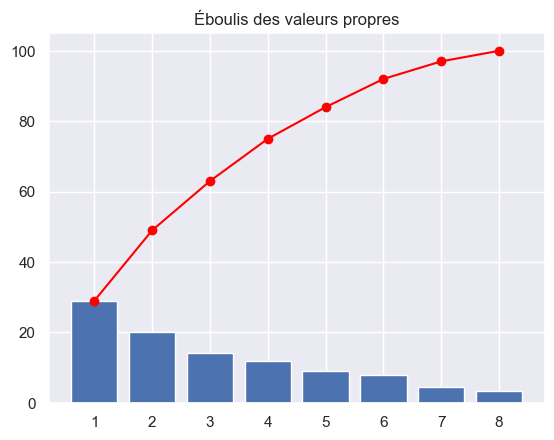

In [81]:
#Visualisation des éboulis et pourcentage d'inertie
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
#plt.xlabel("rang de l\'axe d\'inertie")
#plt.ylabel("pourcentage d\'inertie")
plt.title("Éboulis des valeurs propres")
plt.show(block=False)

En bleu la variance de chaque nouvelle composante, et en rouge la variance cumulée.
Près de 80% de la variance est comprise dans les 5 premières composantes, et près de 90% dans les 6 premières.

#### Composants

In [82]:
#Array de Calcul des composantes
pcs = pca.components_
pcs

array([[ 5.95046102e-01,  4.92991392e-01,  4.77666856e-01,
         2.89762455e-01,  2.48904871e-01,  1.14349364e-01,
         1.21996780e-01, -2.89670939e-02],
       [ 7.02702048e-05,  2.29746804e-01,  2.73061086e-01,
        -5.06108482e-01, -5.75772886e-01, -3.62359040e-02,
         4.71639225e-01,  2.47461581e-01],
       [ 6.85248658e-02, -2.34328205e-01, -2.57302435e-01,
         2.25757532e-01, -1.22458327e-02,  7.65563057e-01,
         4.40526989e-01,  2.07178297e-01],
       [ 1.00891320e-02, -2.32123072e-02, -1.78418314e-02,
         1.18760464e-01,  1.92997244e-01, -2.27863084e-01,
        -1.25055177e-01,  9.38151747e-01],
       [-6.66430513e-02,  1.36356158e-01,  2.27792159e-01,
        -3.47917170e-01, -6.68974525e-02,  5.79772095e-01,
        -6.70502324e-01,  1.17668001e-01],
       [ 5.97055829e-02, -4.77554384e-01,  3.57293436e-01,
        -4.99737063e-01,  5.84397561e-01,  7.20750276e-03,
         2.20031544e-01, -3.15433543e-02],
       [-1.19589214e-01, -5.065414

In [83]:
#DF de calcul des composantes
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7
0,0.59505,0.49299,0.47767,0.28976,0.24890,0.11435,0.12200,-0.02897
1,0.00007,0.22975,0.27306,-0.50611,-0.57577,-0.03624,0.47164,0.24746
2,0.06852,-0.23433,-0.25730,0.22576,-0.01225,0.76556,0.44053,0.20718
3,0.01009,-0.02321,-0.01784,0.11876,0.19300,-0.22786,-0.12506,0.93815
4,-0.06664,0.13636,0.22779,-0.34792,-0.06690,0.57977,-0.67050,0.11767
5,0.05971,-0.47755,0.35729,-0.49974,0.58440,0.00721,0.22003,-0.03154
6,-0.11959,-0.50654,0.62271,0.44386,-0.36840,-0.02064,-0.09043,0.00313
7,0.78665,-0.38143,-0.25186,-0.16440,-0.29567,-0.10483,-0.21635,0.00465


In [84]:
features

Index(['energy_100g', 'fat_100g', 'saturated_fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'sodium_100g'],
      dtype='object')

In [85]:
#Calcul des composantes : arrondis
pcs.columns = features
pcs.index = [f"F{i}" for i in x_list]
pcs.round(2)

,energy_100g,fat_100g,saturated_fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,sodium_100g
F1,0.60,0.49,0.48,0.29,0.25,0.11,0.12,-0.03
F2,0.00,0.23,0.27,-0.51,-0.58,-0.04,0.47,0.25
F3,0.07,-0.23,-0.26,0.23,-0.01,0.77,0.44,0.21
F4,0.01,-0.02,-0.02,0.12,0.19,-0.23,-0.13,0.94
F5,-0.07,0.14,0.23,-0.35,-0.07,0.58,-0.67,0.12
F6,0.06,-0.48,0.36,-0.50,0.58,0.01,0.22,-0.03
F7,-0.12,-0.51,0.62,0.44,-0.37,-0.02,-0.09,0.00
F8,0.79,-0.38,-0.25,-0.16,-0.30,-0.10,-0.22,0.00


In [86]:
#Transposition du df
pcs.T

,F1,F2,F3,F4,F5,F6,F7,F8
energy_100g,0.59505,0.00007,0.06852,0.01009,-0.06664,0.05971,-0.11959,0.78665
fat_100g,0.49299,0.22975,-0.23433,-0.02321,0.13636,-0.47755,-0.50654,-0.38143
saturated_fat_100g,0.47767,0.27306,-0.25730,-0.01784,0.22779,0.35729,0.62271,-0.25186
carbohydrates_100g,0.28976,-0.50611,0.22576,0.11876,-0.34792,-0.49974,0.44386,-0.16440
sugars_100g,0.24890,-0.57577,-0.01225,0.19300,-0.06690,0.58440,-0.36840,-0.29567
fiber_100g,0.11435,-0.03624,0.76556,-0.22786,0.57977,0.00721,-0.02064,-0.10483
proteins_100g,0.12200,0.47164,0.44053,-0.12506,-0.67050,0.22003,-0.09043,-0.21635
sodium_100g,-0.02897,0.24746,0.20718,0.93815,0.11767,-0.03154,0.00313,0.00465


<AxesSubplot: >

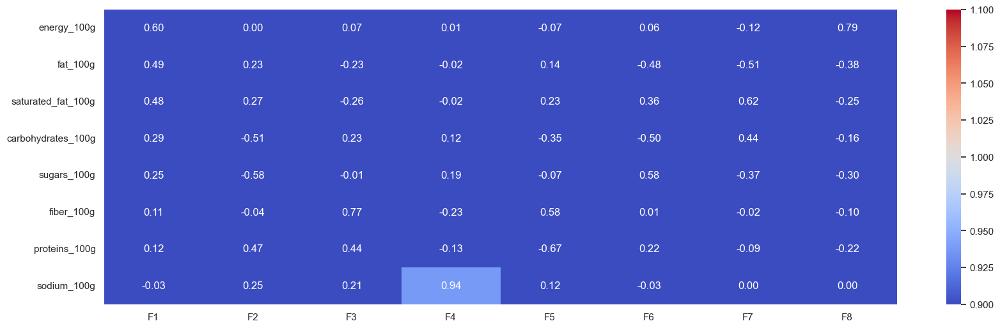

In [87]:
# Representation visuelle des composantes
fig, ax = plt.subplots(figsize=(20,6))
sns.heatmap(pcs.T, vmin=1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")

#### Tracé des cercles de corrélation

In [88]:
x_y = (0,1)
x_y

(0, 1)

In [89]:
# Fonction pour l'affichage du graphique de correlation PCA
def correlation_graph(pca,
                      x_y,
                      features) :
    """Affiche le graphe des correlations

    Positional arguments :
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante :
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0,
                 pca.components_[x, i],
                 pca.components_[y, i],
                 head_width=0.07,
                 head_length=0.07,
                 width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                 pca.components_[y, i] + 0.05,
                 features[i])

    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel("F{} ({}%)".format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel("F{} ({}%)".format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    #Affichage du titre du graphique
    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

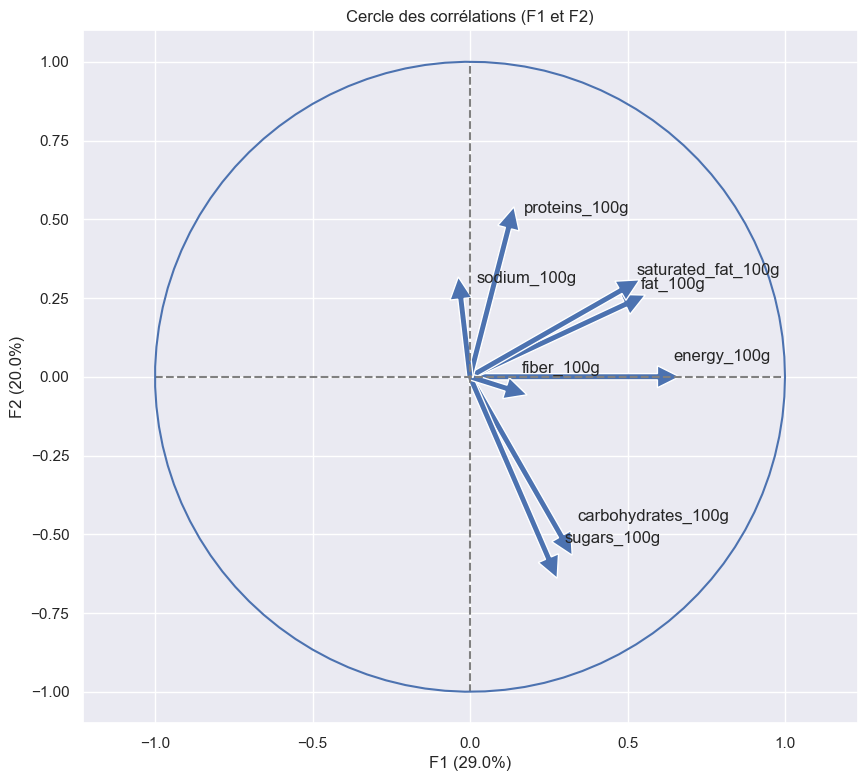

In [90]:
# Choix des axes 1 et 2
correlation_graph(pca, (0,1), features)

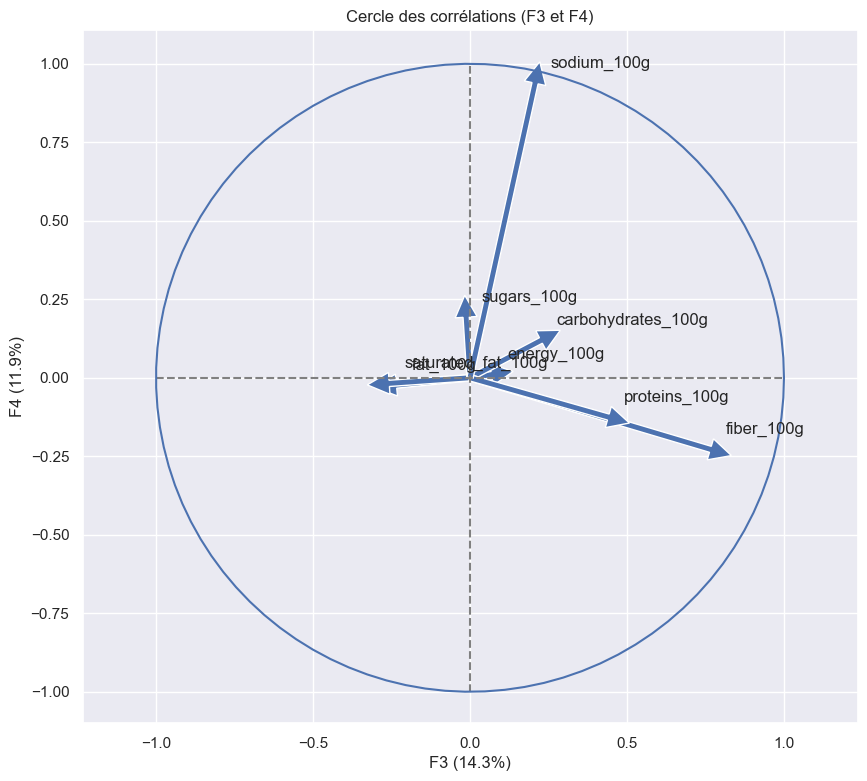

In [91]:
# Choix des axes 3 et 4
correlation_graph(pca, (2,3), features)

Sur le cercle des corrélation F1 (29%) et F2 (20%) :

* 'energy_100g' 'fat_100g' et 'saturated_fat_100g' sont corrélés à respectivement 60%, 49% et 48% sur l'axe F1 mais à 0%, 23%, et 27% sur l'axe F2.
* 'sodium_100g' est faiblement anti-corrélé à F1 (-3%) mais corrélé à F2 à près de 25%.
* 'carbohydrates_100g' et 'sugars_100g' sont peu corrélés à F1 à 29% et 25% mais anti-corrélés à F2 pour 51 et 58%
* 'fiber_100g' est peu corrélé à F1 et F2 avec 11% et -4% avec F2
* 'proteins_100' est peu corrélé à F1 et F2 avec -3% et 25% avec F2

L'énergie est représentée sur l'axe F1.
L'axe F2 représente sel pour sa partie supérieure à 1 et le sucré pour sa partie négative.


Sur le cercle des corrélation F3 (14.3%) et F4 (11.9%) :

* 'carbohydrates_100g' est corrélé à 23% sur l'axe F3 et proche de 12% sur l'axe F4
* 'sugars_100g' est corrélé à -1% sur l'axe F3 et est anti-corrélé à près de 19% sur l'axe F4
* 'sodium_100g' est corrélé à 21% sur l'axe F3 et 94% sur l'axe F4
* 'fiber_100g' est corrélé à 77% sur l'axe F1 et à -23% sur l'axe F4
* 'proteins_100g' est corrélé à l'axe F3 à 44% mais est corrélé à -13% sur l'axe F4.


L'axe F3 en anticorrélation est représenté la variable gras, alors que sur la partie positive nous avons les valeurs glucide, fibre et proteines donc les nutriments utiles à l'alimentation
L'axe F4 à le sodium qui est représenté à plus de 90 %, nous avons donc les aliments ayant peu d'impact sur les qualités nutritionnelles

#### Projections

In [92]:
X_proj = pca.transform(X_scaled)
X_proj[:5]

array([[ 2.38946765, -2.3057655 , -0.1366542 ,  0.4531174 , -0.09098253,
         0.29384067,  0.09795926, -0.587169  ],
       [ 0.53333386, -2.65701369, -0.52049174,  0.59544444,  0.17903578,
         2.62962261, -1.81266533,  0.19357415],
       [ 0.87756726, -0.94617498,  0.56315152, -0.09354573, -0.01988433,
         1.87005544, -1.14945259,  1.04429687],
       [-1.63825416, -0.56361693, -0.69702534, -0.09858788,  0.34891191,
        -0.12219934,  0.05730341, -0.17884821],
       [-0.42586622,  0.76613487, -0.30576917, -0.25455692,  0.32219924,
         0.52335414,  0.63989458,  0.36673808]])

In [93]:
#Rappel
x_y

(0, 1)

In [94]:
def display_factorial_planes(   X_projected,
                                x_y,
                                pca=None,
                                labels = None,
                                clusters=None,
                                alpha=1,
                                figsize=[10,8],
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments :
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments :
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8]
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize:
        figsize = (7,6)

    # On gère les labels
    if  labels is None :
        labels = []
    try :
        len(labels)
    except Exception as e :
        raise e

    # On vérifie la variable axis
    if not len(x_y) ==2 :
        raise AttributeError("2 axes sont demandées")
    if max(x_y )>= X_.shape[1] :
        raise AttributeError("la variable axis n'est pas bonne")

    # on définit x et y
    x, y = x_y

    # Initialisation de la figure
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters

    # Les points
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha,
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue=c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe
    if pca :
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else :
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f"F{x+1} {v1}")
    ax.set_ylabel(f"F{y+1} {v2}")

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) :
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center')

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()

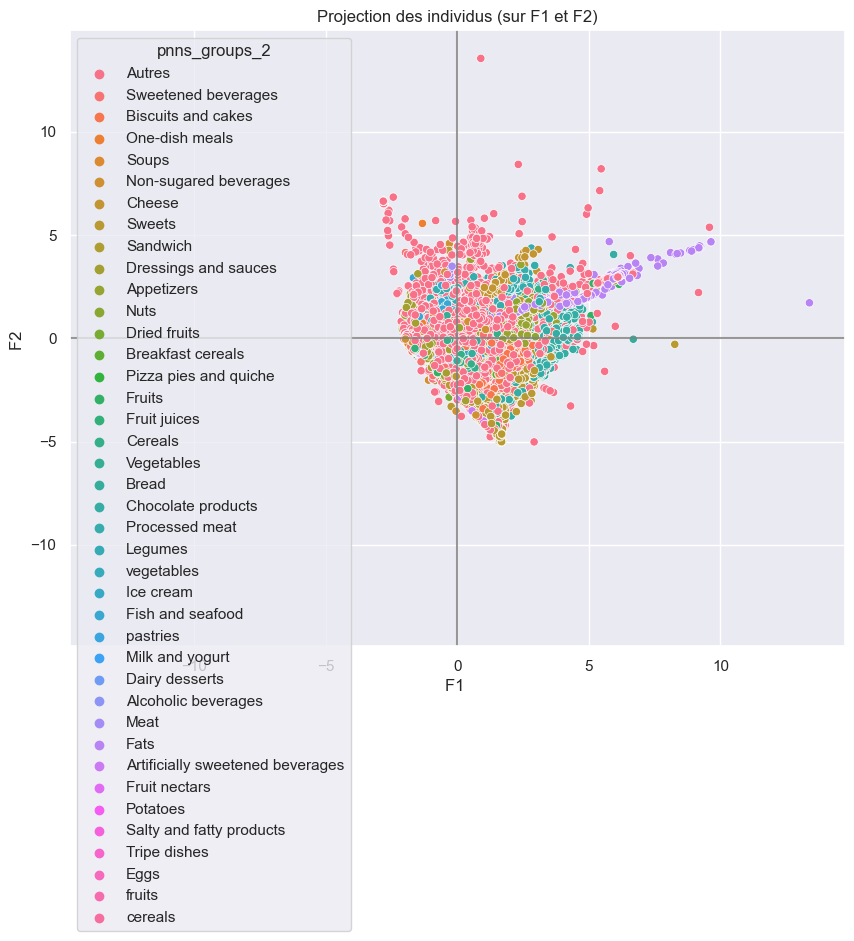

In [95]:
x_y = [0,1]
sns.color_palette("rocket")
display_factorial_planes(X_proj, x_y, clusters=data_proj['pnns_groups_2'])

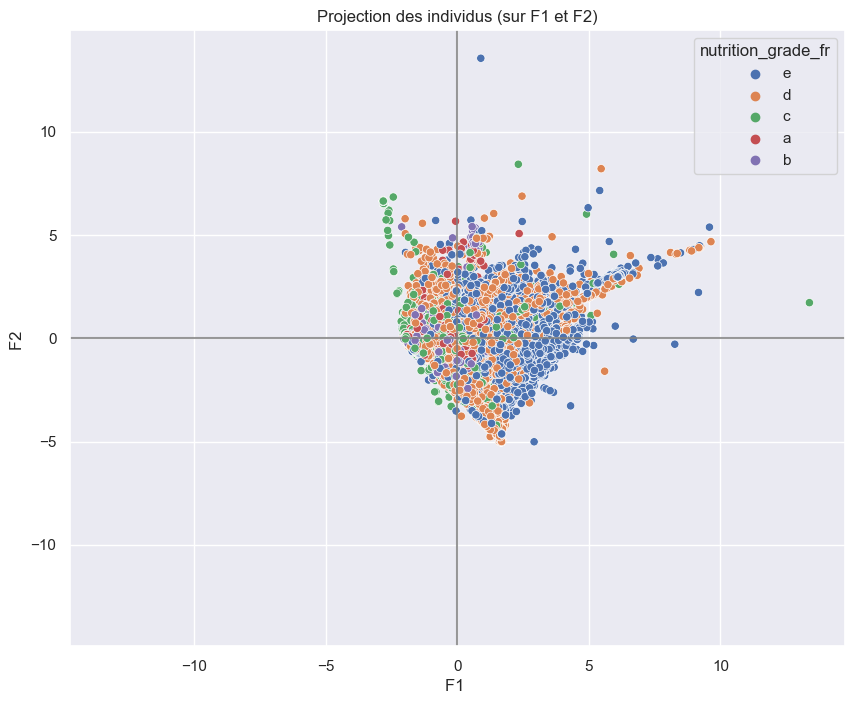

In [96]:
x_y = [0,1]
display_factorial_planes(X_proj, x_y, clusters=data_proj['nutrition_grade_fr'])

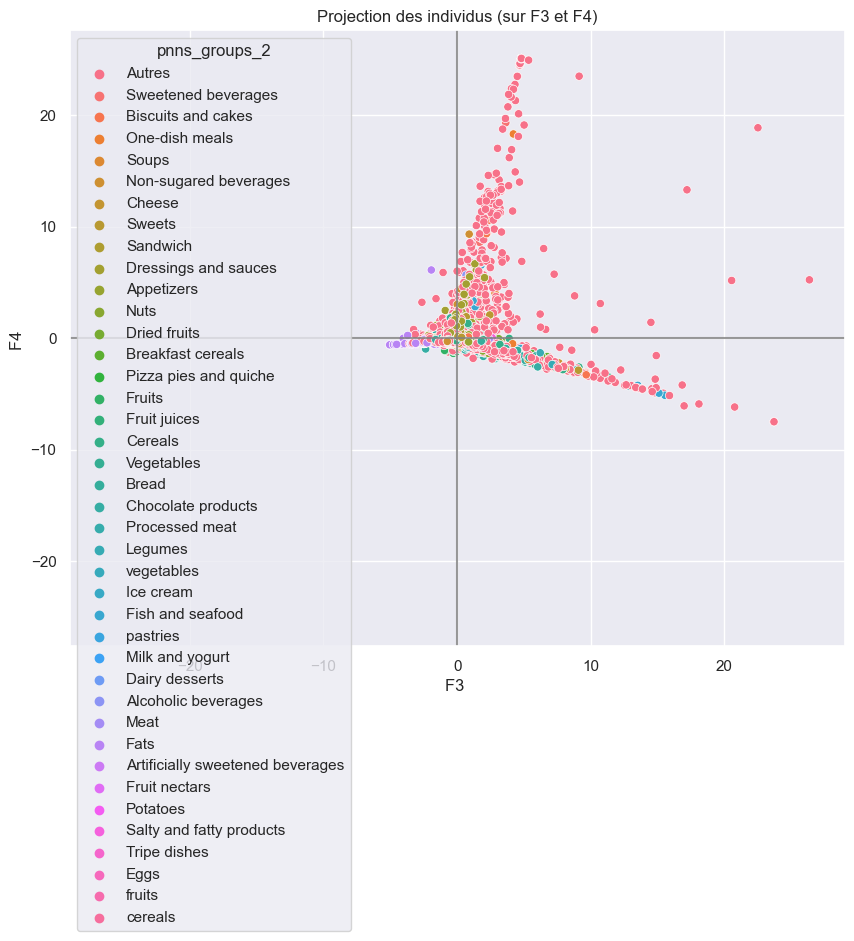

In [97]:
x_y = [2,3]
sns.color_palette("rocket")
display_factorial_planes(X_proj, x_y, clusters=data_proj['pnns_groups_2'])

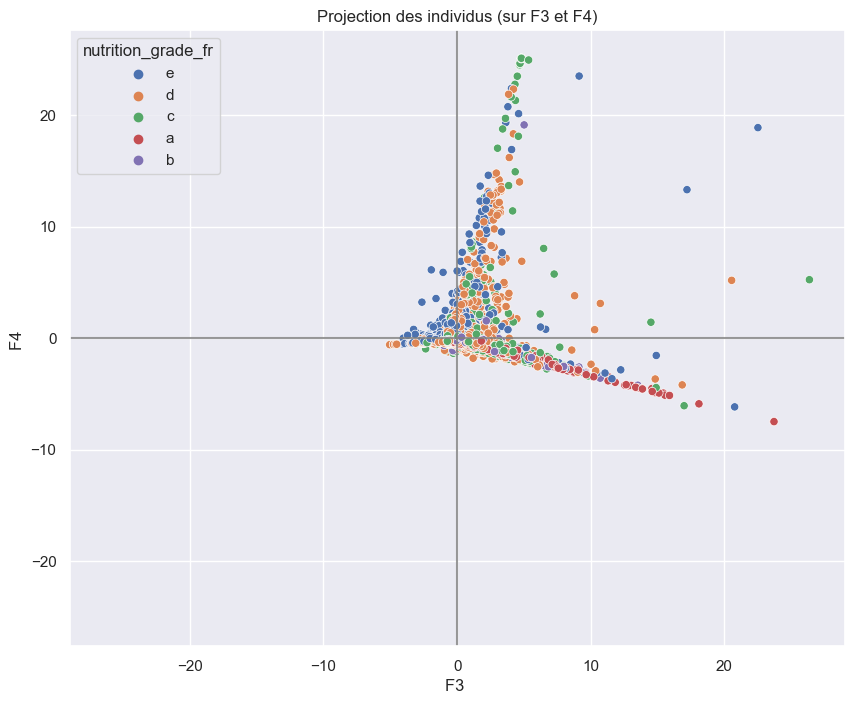

In [98]:
x_y = [2,3]
display_factorial_planes(X_proj, x_y, clusters=data_proj['nutrition_grade_fr'])

Nous pouvons observer une très forte corrélation entre les pnns et le nutrition grade.